# ==== Import Modules and Load Data ====

In [25]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

sns.set(
    { "figure.figsize": (17, 7) },
    style='ticks',
    palette=sns.color_palette("Set2"),
    color_codes=True,
    font_scale=5
)

plt.rcParams.update({
    "axes.labelsize": 12,  # Axes label font size
})

%config InlineBackend.figure_format = 'retina'
import warnings
warnings.filterwarnings('ignore')

In [26]:
# Load the dataset
auto = pd.read_csv('adverts.csv')

# ==== General Evaluation ====

In [27]:
# View Data
auto

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol
3,202007080986776,45000.0,16,Brown,Vauxhall,Mokka,USED,2016.0,7995,Hatchback,False,Diesel
4,202007161321269,64000.0,64,Grey,Land Rover,Range Rover Sport,USED,2015.0,26995,SUV,False,Diesel
...,...,...,...,...,...,...,...,...,...,...,...,...
402000,202010315652942,5179.0,69,Grey,Peugeot,208,USED,2019.0,10595,Hatchback,False,Petrol
402001,202010315657341,110000.0,59,Red,Peugeot,107,USED,2009.0,2000,Hatchback,False,Petrol
402002,202010315659271,52760.0,62,White,Nissan,Qashqai,USED,2012.0,7250,SUV,False,Petrol
402003,202011015662436,10250.0,65,Red,Abarth,595,USED,2015.0,11490,Hatchback,False,Petrol


In [43]:
for column in auto.columns:
    try:
        print(column, "min", auto[column].min(), "max", auto[column].max())
    except:
        next

public_reference min 201307177852187 max 202011025683478
mileage min 0.0 max 999999.0
standard_make min AC max Zenos
standard_model min 1 Series max up!
vehicle_condition min NEW max USED
year_of_registration min 999.0 max 2020.0
price min 120 max 9999999
crossover_car_and_van min False max True


In [29]:
# View feature data types 
auto.dtypes

public_reference           int64
mileage                  float64
reg_code                  object
standard_colour           object
standard_make             object
standard_model            object
vehicle_condition         object
year_of_registration     float64
price                      int64
body_type                 object
crossover_car_and_van       bool
fuel_type                 object
dtype: object

In [7]:
# Check for null values

null_counts = pd.DataFrame({
    'column': auto.columns,
    'null_count': [auto[col].isnull().sum() for col in auto.columns]
})
null_counts.sort_values(by="null_count", ascending=False)

,column,null_count
7,year_of_registration,33311
2,reg_code,31857
3,standard_colour,5378
9,body_type,837
11,fuel_type,601
1,mileage,127
0,public_reference,0
4,standard_make,0
5,standard_model,0
6,vehicle_condition,0


In [51]:
# Set the years of reg for new cars to 2020
auto.loc[(auto["vehicle_condition"]=="NEW") & (auto["year_of_registration"].isna()), "year_of_registration"] = 2020

In [53]:
auto.loc[auto["year_of_registration"].isna() & auto["reg_code"].notna()]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
54,202007030806426,30000,18,Red,Vauxhall,Insignia,USED,<NA>,11990,Hatchback,False,Petrol
83,202008222801747,42847,61,Red,Honda,Jazz,USED,<NA>,5695,Hatchback,False,Petrol
865,202010084741550,43130,66,White,Land Rover,Range Rover Sport,USED,<NA>,35990,SUV,False,Diesel
968,202010305607535,63369,17,Blue,SKODA,Rapid Spaceback,USED,<NA>,7490,Hatchback,False,Diesel
1256,202010225294466,18715,68,White,Volvo,V40,USED,<NA>,16950,<NA>,False,Petrol
...,...,...,...,...,...,...,...,...,...,...,...,...
400336,202010315635977,66287,63,Blue,Vauxhall,Astra GTC,USED,<NA>,8400,Coupe,False,Petrol
400725,202008252905656,45,20,Silver,Land Rover,Range Rover Evoque,USED,<NA>,46945,SUV,False,Diesel
401314,202010315635541,12522,67,Red,Dacia,Sandero,USED,<NA>,6300,Hatchback,False,Petrol
401323,201909222504136,46000,13,Grey,Volkswagen,Caravelle,USED,<NA>,22995,MPV,False,Diesel


In [52]:
# Check for null values

null_counts = pd.DataFrame({
    'column': auto.columns,
    'null_count': [auto[col].isnull().sum() for col in auto.columns]
})
null_counts.sort_values(by="null_count", ascending=False)

,column,null_count
2,reg_code,31857
3,standard_colour,5378
7,year_of_registration,2062
9,body_type,837
11,fuel_type,601
1,mileage,127
0,public_reference,0
4,standard_make,0
5,standard_model,0
6,vehicle_condition,0


In [8]:
# Check for empty strings

empty_strings = (auto == "").sum()
print("Number of empty strings in each column")
print(empty_strings)

Number of empty strings in each column
public_reference         0
mileage                  0
reg_code                 0
standard_colour          0
standard_make            0
standard_model           0
vehicle_condition        0
year_of_registration     0
price                    0
body_type                0
crossover_car_and_van    0
fuel_type                0
dtype: int64


In [9]:
# Check for 0 values

zero_vals = (auto == 0).sum()
print("Number of zero values in each column")
print(zero_vals)

Number of zero values in each column
public_reference              0
mileage                   16207
reg_code                      0
standard_colour               0
standard_make                 0
standard_model                0
vehicle_condition             0
year_of_registration          0
price                         0
body_type                     0
crossover_car_and_van    400210
fuel_type                     0
dtype: int64


In [10]:
# Check for numbers composed entirely of 9s

all_nines = auto.applymap(lambda x: str(x).isdigit() and set(str(x)) == {'9'})

count_all_nines = all_nines.sum()
print("Number of all 9 values in each column")
print(count_all_nines)

Number of all 9 values in each column
public_reference            0
mileage                     0
reg_code                    0
standard_colour             0
standard_make               0
standard_model              0
vehicle_condition           0
year_of_registration        0
price                    1056
body_type                   0
crossover_car_and_van       0
fuel_type                   0
dtype: int64



---
&nbsp;

&nbsp;

# ==== Price ====

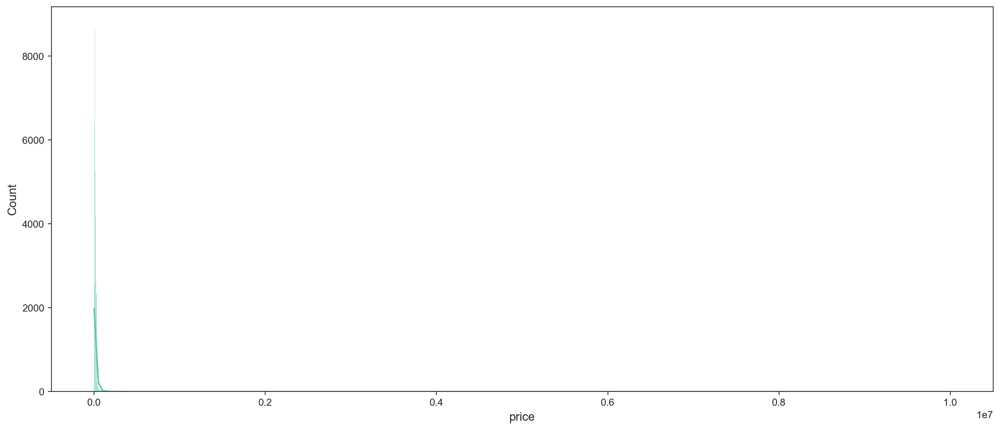

In [11]:
# Visualise spread of price
sns.histplot(auto, kde=True, x="price");

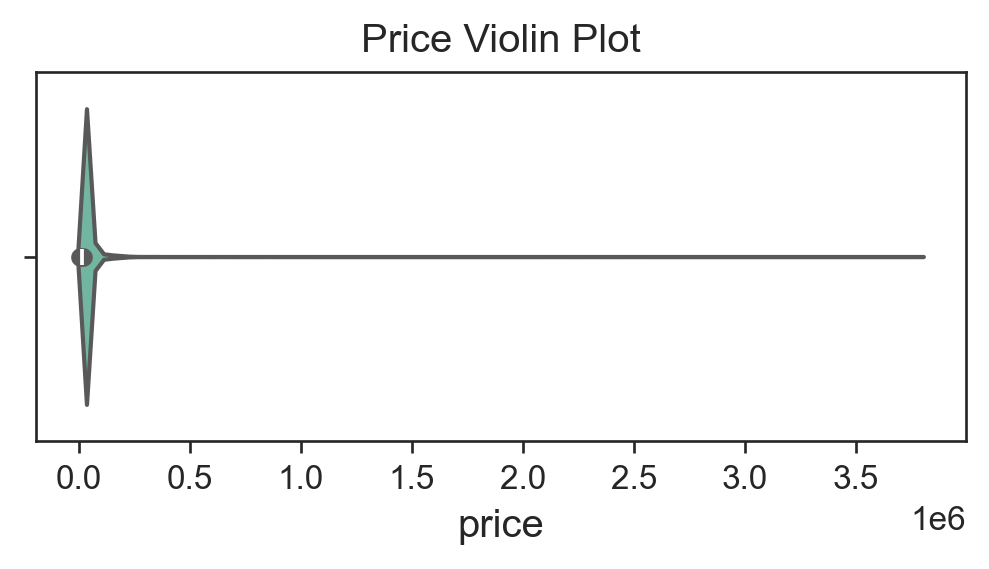

In [21]:
# Visualise spread of price
plt.figure(figsize=(5, 2), dpi=120)
plt.title("Price Violin Plot");
sns.violinplot(auto, x="price");
plt.savefig("/Users/hal/Documents/Essays/AutoML/price_violin_og.png", bbox_inches='tight', dpi=240)

Price is skewed by a small number of extremely large prices. These will need investigating to see if they are erroneous and this feature is likely a good candidate for box-cox or other transformation.

In [13]:
# Check extreme prices.
auto.loc[auto["price"] > 1e6].sort_values(by="price", ascending=False)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
147188,202009103539048,100.0,NaN,Grey,Maserati,3500,USED,NaN,9999999,Convertible,False,Petrol
252505,202008112331147,46300.0,NaN,Blue,Ferrari,275,USED,NaN,9999999,Coupe,False,Petrol
336536,202006180262926,4400.0,NaN,White,Porsche,959,USED,NaN,9999999,Coupe,False,Petrol
305436,201812223434109,3600.0,NaN,Grey,Lamborghini,Miura,USED,NaN,9999999,Coupe,False,Petrol
141833,202007050883898,87450.0,NaN,Red,Ferrari,250,USED,NaN,9999999,Coupe,False,Petrol
336202,202001226429470,950.0,NaN,Black,Ferrari,LaFerrari,USED,NaN,9999999,Coupe,False,Petrol
198060,202008252907180,300.0,17,NaN,Ferrari,LaFerrari,USED,2017.0,3799995,NaN,False,NaN
51741,202002257718775,4400.0,14,Black,Bugatti,Veyron,USED,2014.0,2850000,Coupe,False,Petrol
64910,202006039766650,189.0,NaN,Black,McLaren,P1,USED,NaN,2695000,Coupe,False,Petrol Plug-in Hybrid
223835,202007081011555,1000.0,67,Blue,Bugatti,Chiron,USED,2018.0,2500000,Coupe,False,Petrol


 Some prices are 9999999 which are erroneous and need replacing.
 
 Other unusual prices:

202007251680060	45.0	L	Silver	Porsche	911	USED	1993	£1,395,000	Coupe

202007271729483	45.0	L	Silver	Porsche	911	USED	1993	£1,395,000	Coupe	

202010225285486	1500.0	15	Yellow	Porsche	918	USED	2019	£1,200,000	Convertible	

202010215263340	2200.0	NaN	Black	Porsche	918	USED	2016	£1,099,950	Convertible	

201903276321916	2911.0	15	White	Porsche	918	USED	2015	£1,050,000	NaN	

In [14]:
# 9999999 prices are erroneous and should be removed
auto["price"].replace({9999999: np.nan}, inplace=True)

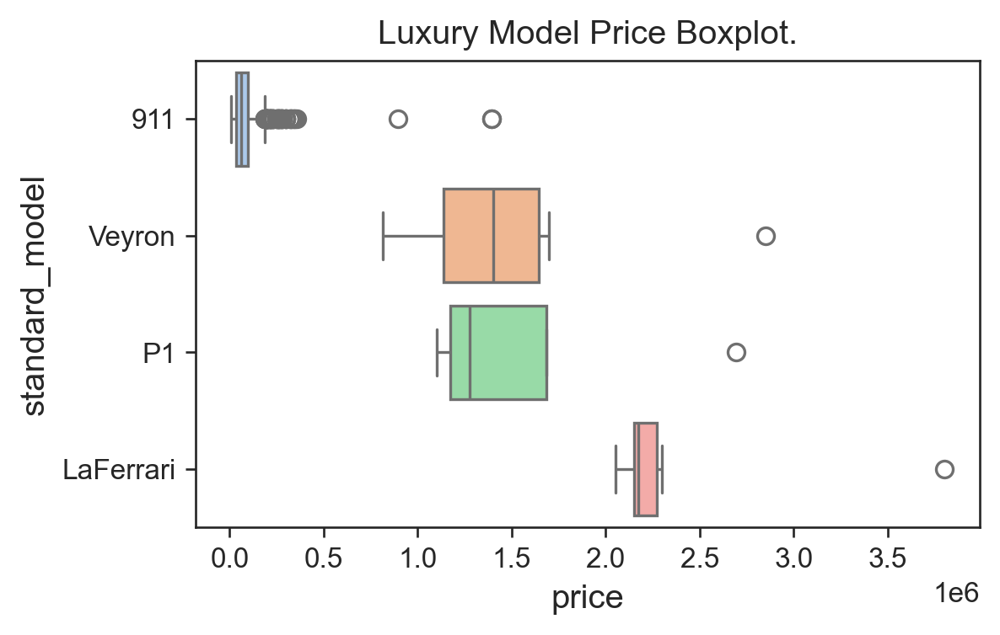

In [20]:
plt.figure(figsize=(5, 3), dpi=120)
combined_prices = auto.loc[auto["standard_model"].isin(["Veyron", "LaFerrari", "P1", "911"]), ["price", "standard_model"]]
plt.title("Luxury Model Price Boxplot.");
sns.boxplot(data=combined_prices, y="standard_model", x="price", palette="pastel");
plt.savefig("/Users/hal/Documents/Essays/AutoML/price_luxury_outliers.png", bbox_inches='tight', dpi=240)

These models show some outliers which greatly exceed other, similar cars. There is presumably some tool/function to automatically find these.

In [17]:
from sklearn.ensemble import IsolationForest

for model_name in ["Veyron", "LaFerrari", "P1"]:
    model_data = auto.loc[auto["standard_model"] == model_name, ["price"]]

    data_cropped = model_data.dropna(subset=["price"])

    # Prepare the price data
    prices = data_cropped["price"].values.reshape(-1, 1)  # Reshape for IsolationForest

    # Train the IsolationForest
    iso_forest = IsolationForest(contamination=0.05, random_state=42)  # Adjust contamination as needed
    iso_forest.fit(prices)

    # Predict outliers
    data_cropped["outlier"] = iso_forest.predict(prices)  # 1 = inlier, -1 = outlier

    # Print outliers
    outliers = data_cropped.loc[data_cropped["outlier"] == -1]
    print(f"Outliers for {model_name}:\n", outliers)

Outliers for Veyron:
            price  outlier
51741  2850000.0       -1
Outliers for LaFerrari:
             price  outlier
198060  3799995.0       -1
Outliers for P1:
            price  outlier
64910  2695000.0       -1


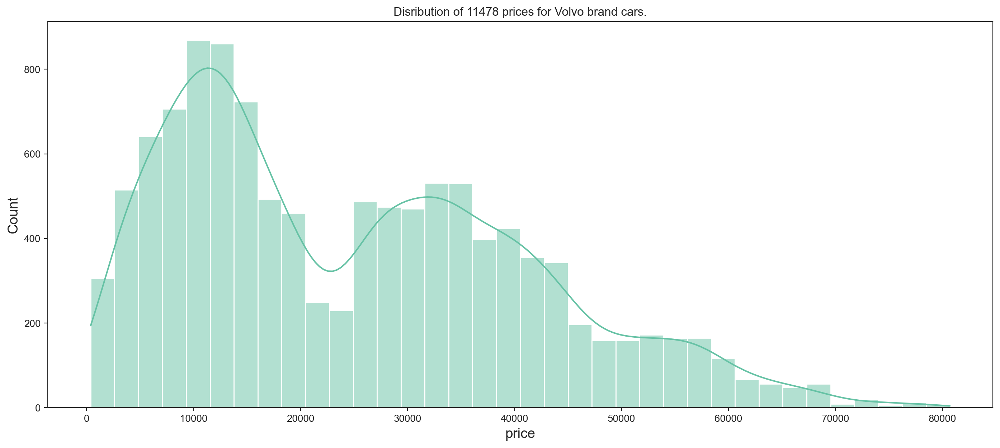

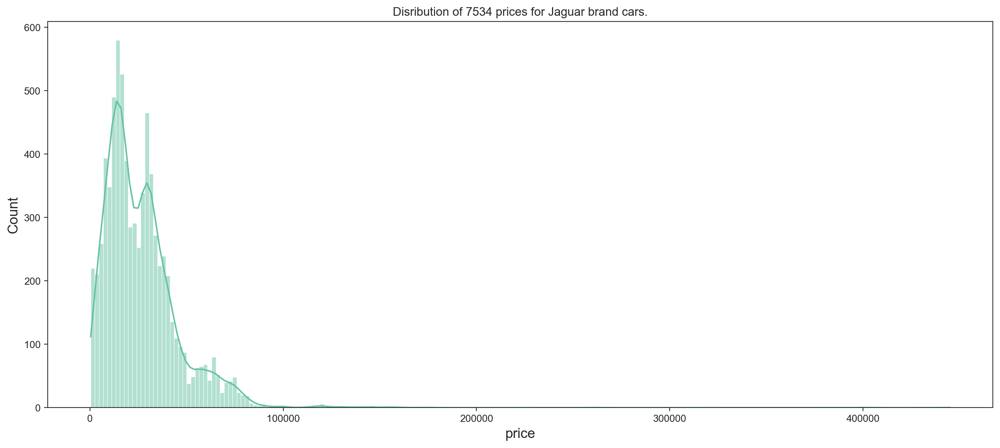

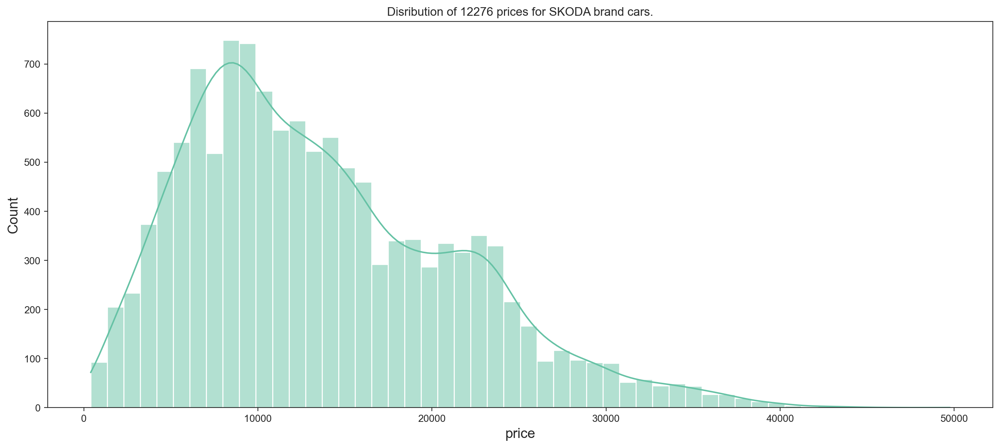

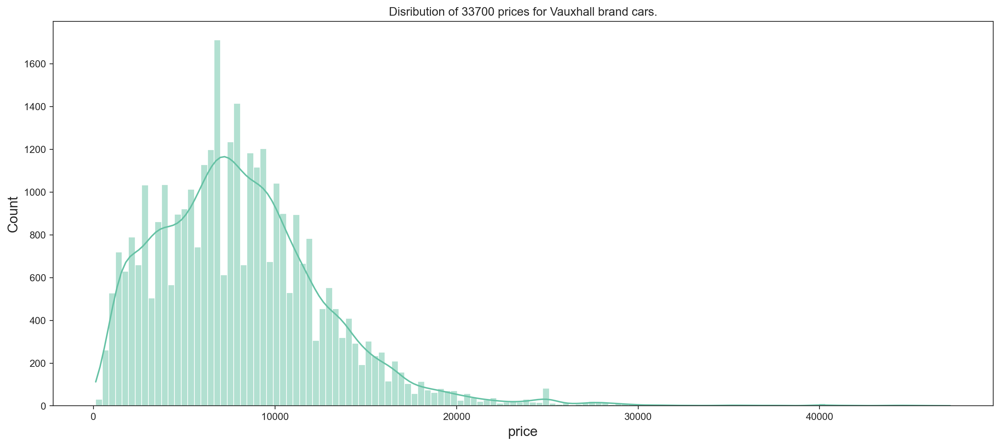

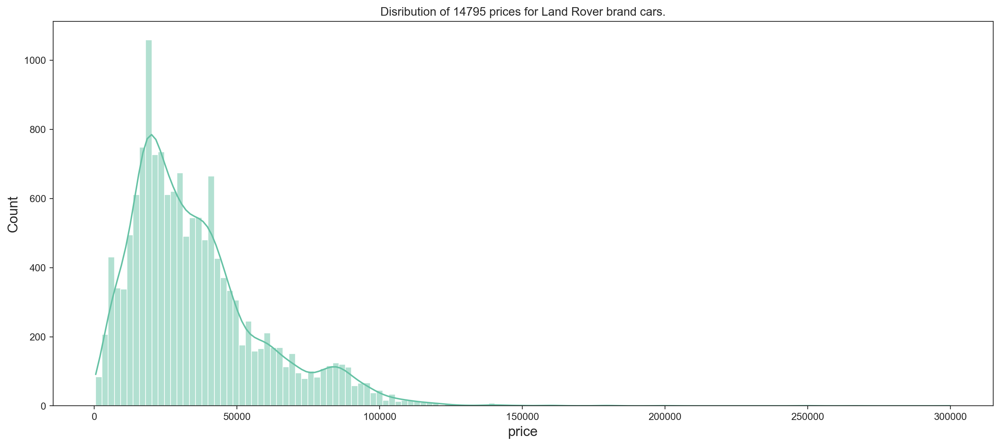

...

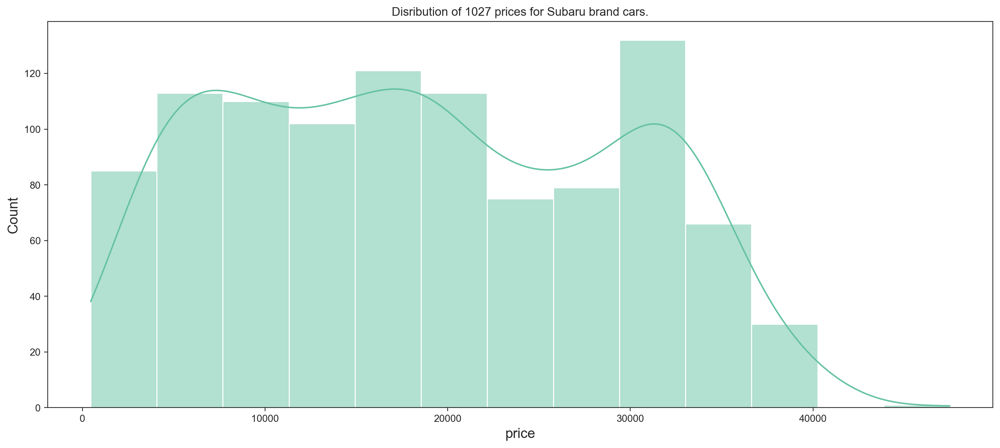

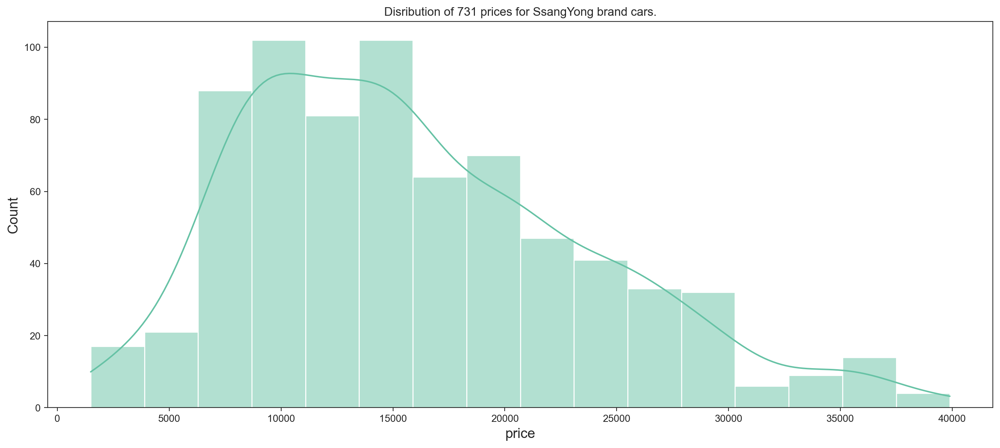

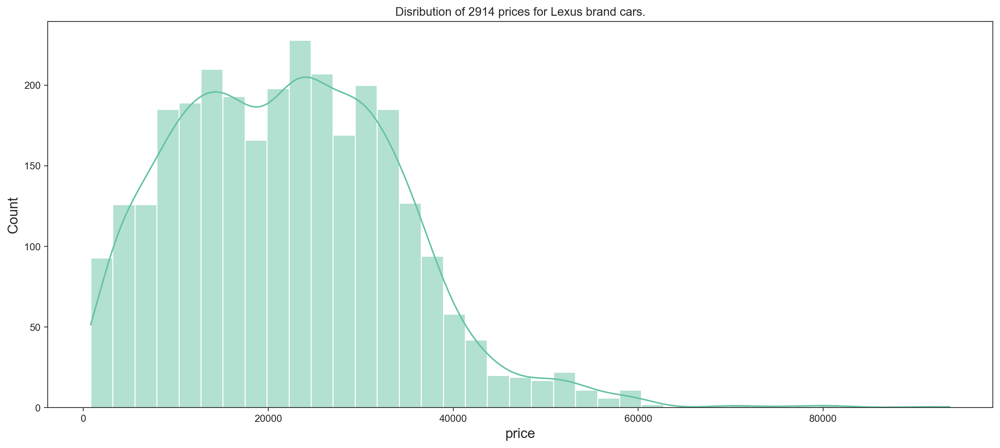

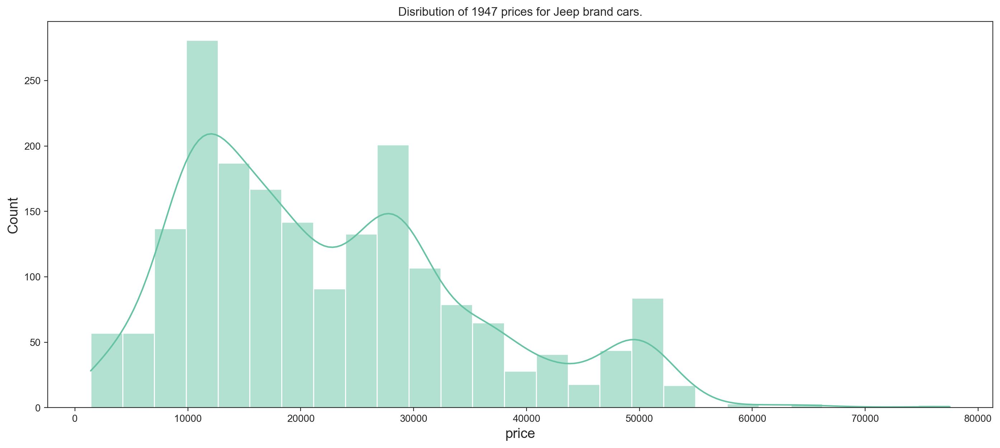

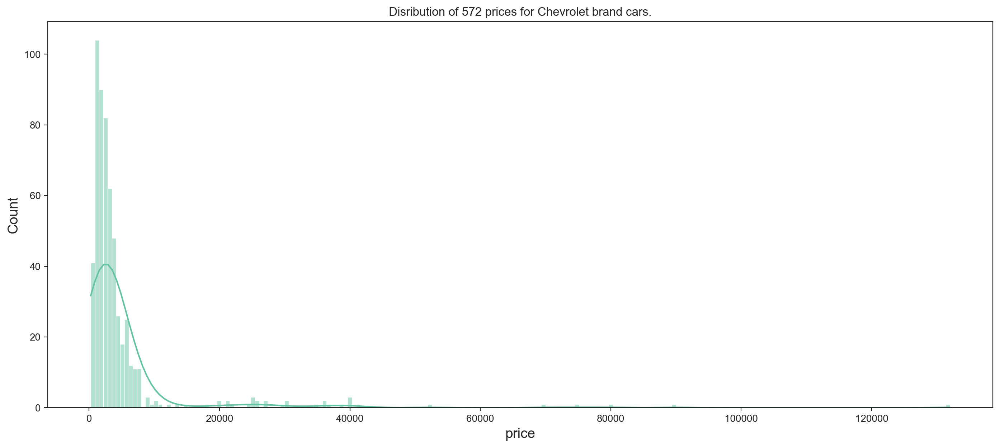

In [18]:
# Visualise spread of price for each brand
for make in auto["standard_make"].unique():
    count = len(auto.loc[auto["standard_make"]==make])
    if count > 500:
        sns.histplot(auto.loc[auto["standard_make"]==make], kde=True, x="price");
        plt.title(f"Disribution of {count} prices for {make} brand cars.")
        plt.show()

## Price - Summary

The prices have some extremely large values including 999999 values which need removing as well as a large positive skew which may benefit from transforming. Additionally, Porsche, Ferrari and Mercedes-Benz appear to have some significant outliers in terms of price

---
&nbsp;

&nbsp;

# ==== Public Reference ====

In [19]:
auto.sample(1)["public_reference"]

117018    202007070941788
Name: public_reference, dtype: int64

In [20]:
def format_entry(entry):
    year = str(entry["year_of_registration"].values[0])[:4]
    make = entry["standard_make"].values[0]
    model = entry["standard_model"].values[0]
    mileage = int(entry["mileage"].values[0])
    price = entry["price"].values[0]
    
    return f"{year} {make} {model} with {mileage:,} miles and price £{price:,}"

In [21]:
def format_ref(entry):
    entry = str(entry["public_reference"].values[0])
    year = entry[:4]
    month = entry[4:6]
    day = entry[6:8]
    rest = entry[8:]
    
    return year, month, day, rest

In [22]:
sample = auto.sample()
print(format_entry(sample))
print(format_ref(sample))

2011 Vauxhall Corsa with 44,000 miles and price £4,490.0
('2020', '06', '06', '9861260')


Pubic reference appears to include the year, month, day that the car was listed as well as some other numbers which are possibly a unique id.
This data can be extracted and added as new features.

---
&nbsp;

&nbsp;

# ==== Mileage ====

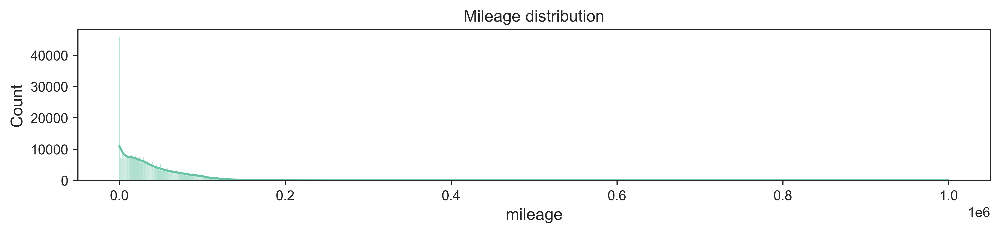

In [22]:
plt.figure(figsize=(12, 2), dpi=220)
sns.histplot(auto, x="mileage", kde=True);
plt.title("Mileage distribution");
plt.savefig("/Users/hal/Documents/Essays/AutoML/mileage_hist.png", bbox_inches='tight', dpi=240)

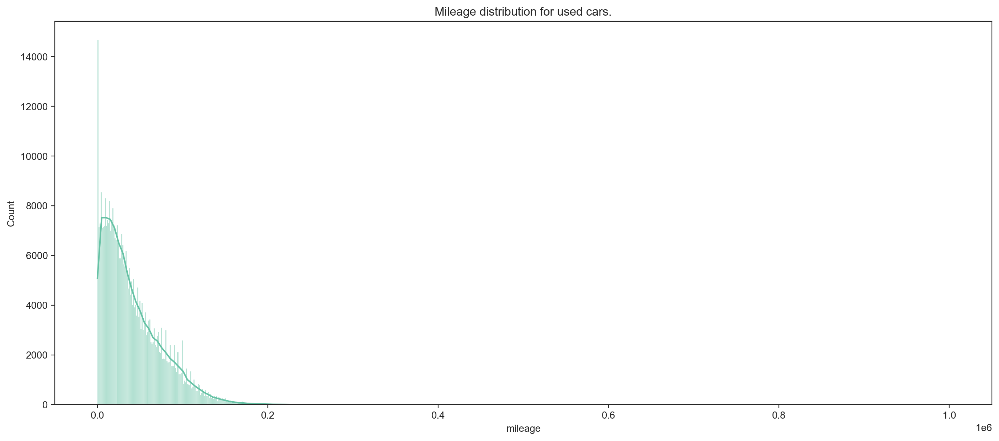

In [17]:
used = auto.loc[auto["vehicle_condition"] == "USED"]
sns.histplot(used, x="mileage", kde=True);
plt.title("Mileage distribution for used cars.");

Large spike around 0 miles which seems unusual given that this data is for used cars. Additionally, there are a few extremely large values which warrant investigating.

In [18]:
# Very large mileage entries
auto.loc[(auto["mileage"] > 3e5)].sort_values(by="mileage", ascending=False)

# Some make sense such as the taxis, however, there are some values which are much too high for the age and type of the car.

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
43974,202008122406434,999999.0,63,White,Vauxhall,Astra,USED,2013.0,9999.0,Hatchback,False,Diesel
63569,202010235350884,990000.0,07,Red,Vauxhall,Zafira,USED,2007.0,1200.0,MPV,False,Diesel
85043,202010285542410,930000.0,56,Blue,BMW,1 Series,USED,2006.0,2500.0,Hatchback,False,Petrol
131508,202010064664710,788072.0,68,Blue,MINI,Countryman,USED,2018.0,22875.0,SUV,False,Petrol
240577,202009244163289,740000.0,11,White,Mercedes-Benz,E Class,USED,2011.0,10500.0,Convertible,False,Diesel
115277,202010215262290,740000.0,14,Blue,Volvo,XC90,USED,2014.0,14795.0,SUV,False,Diesel
333167,202010225297076,611121.0,13,White,Fiat,500,USED,2013.0,4500.0,Hatchback,False,Petrol
77727,202007301907676,413079.0,59,Beige,SKODA,Octavia,USED,2010.0,1299.0,Hatchback,False,Diesel
178876,202009033271274,400321.0,16,White,BMW,X5,USED,2016.0,28690.0,SUV,False,Diesel
382567,202009294349326,388000.0,13,Green,SKODA,Superb,USED,2013.0,1989.0,Estate,False,Diesel


In [19]:
# These older, used cars have zero miles which is highly unlikely and should be corrected
auto.loc[(auto["mileage"] == 0) & (auto["vehicle_condition"] == "USED") & (auto["year_of_registration"] < 2018)]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
1656,202011015669636,0.0,13,Silver,Vauxhall,Insignia,USED,2013.0,2975.0,Hatchback,False,Diesel
2754,202008283030532,0.0,63,Black,Audi,A1,USED,2013.0,8000.0,Hatchback,False,Diesel
8677,201704033991344,0.0,D,Red,Porsche,911,USED,1987.0,89995.0,Convertible,False,Petrol
17265,202010215247763,0.0,65,Red,Renault,Kadjar,USED,2015.0,10699.0,SUV,False,Diesel
52682,202010305604067,0.0,61,Black,BMW,X6,USED,2011.0,14000.0,SUV,False,Diesel
67889,202010215247760,0.0,15,Silver,Kia,Venga,USED,2015.0,6699.0,MPV,False,Petrol
77011,202003098187857,0.0,W,Grey,Porsche,911,USED,1981.0,130000.0,Coupe,False,Petrol
92881,202009294364995,0.0,V,Silver,Honda,Civic,USED,1999.0,1496.0,Hatchback,False,Petrol
122534,202009294330750,0.0,C,Multicolour,Land Rover,Defender 110,USED,1986.0,89995.0,SUV,False,Petrol
132740,202009083453747,0.0,66,White,Volkswagen,up!,USED,2016.0,7995.0,Hatchback,False,Petrol


In [20]:
# Some crazy mileage values for these 2020 cars.
auto.loc[(auto["year_of_registration"] == 2020) & (auto["mileage"] > 1e5)]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
85334,202010225290196,152000.0,20,Black,Land Rover,Discovery 4,USED,2020.0,14995.0,MPV,False,Petrol
104829,202010315659744,126602.0,70,White,Vauxhall,Combo,USED,2020.0,995.0,Combi Van,True,Diesel
123417,202007271766248,102000.0,20,Grey,Mazda,Bongo,USED,2020.0,8495.0,MPV,False,Petrol
148395,202010225304217,149000.0,70,Black,Land Rover,Range Rover,USED,2020.0,28995.0,SUV,False,Diesel
157710,202008142464449,250000.0,20,Black,SEAT,Arona,USED,2020.0,16995.0,SUV,False,Diesel
164023,202010265462768,150000.0,70,Silver,Volkswagen,Transporter,USED,2020.0,8995.0,Window Van,True,Diesel
173867,202010315658234,145000.0,70,NaN,Land Rover,Range Rover Sport,USED,2020.0,7850.0,SUV,False,Diesel
254446,202010305602112,114000.0,NaN,White,Toyota,Estima,USED,2020.0,5995.0,MPV,False,Petrol
285648,202002237639035,125250.0,20,Silver,Toyota,Estima,USED,2020.0,6995.0,MPV,False,Petrol Hybrid
346927,202010225313436,140000.0,70,NaN,Audi,TT,USED,2020.0,995.0,Convertible,False,Petrol


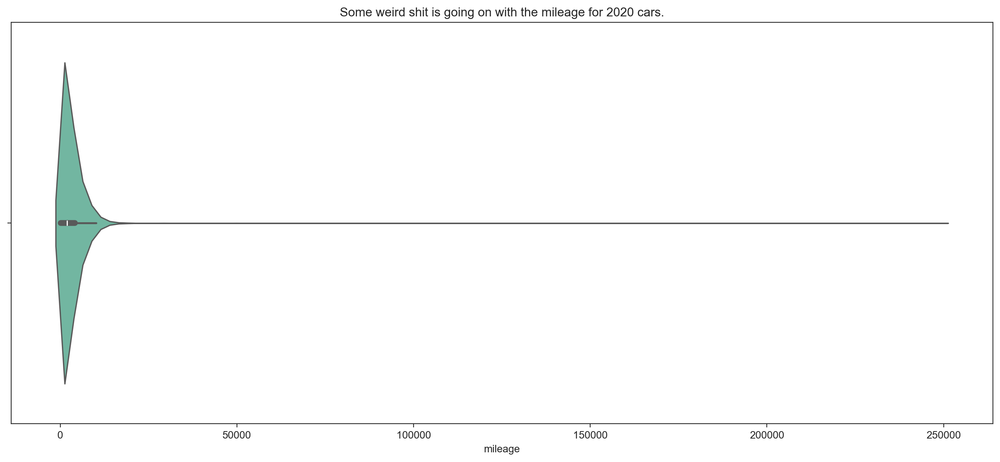

In [21]:
new_mileage = auto.loc[(auto["year_of_registration"] == 2020)]
sns.violinplot(new_mileage, x="mileage");
plt.title("Some extreme outliers in mileage for 2020 cars.");

These mileages are either off or the year of registration could be wrong. Looking at the reg codes they all (except one) have 2020 codes though so it is unlikely the year is wrong. Given that 250000.0 is both suspiciously round and virtually impossible to do in a single year, there must be an error here.

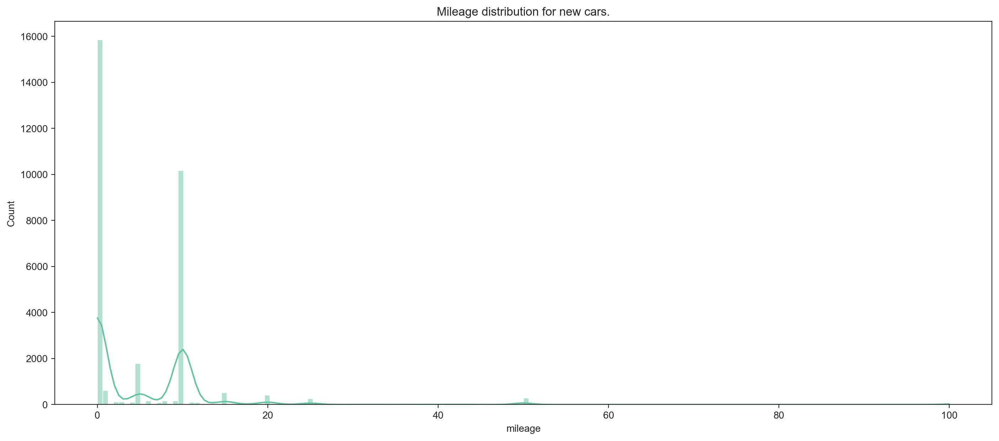

In [22]:
# New cars all have reasonable and low mileage.

new = auto.loc[auto["vehicle_condition"] == "NEW"]
sns.histplot(new, x="mileage", kde=True);
plt.title("Mileage distribution for new cars.");

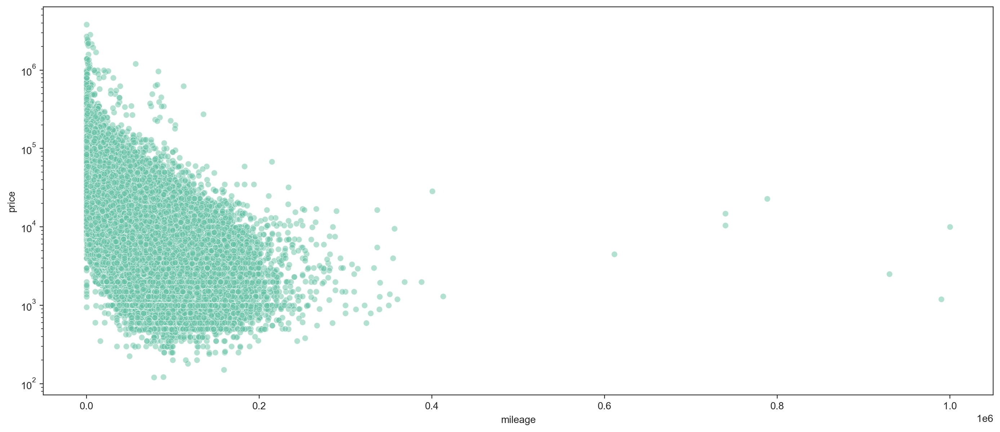

In [23]:
ax = sns.scatterplot(auto, x="mileage", y="price", alpha=0.5);
ax.set_yscale('log')

## Mileage Summary

New cars have mileage as expected. Extreme high and low values for used cars, particularly for recent (2020) cars. Need to be assessed for how realistic they are and then replaced.

---

&nbsp;
&nbsp;

# ==== Reg Code ====

Reg codes by year:

| Year of Release | 1st Half Plate Numbers | 2nd Half Plate Numbers |
| --------------- | ------------------------------------------------ | ---------------------------------------------------------- |
| 2024/25         | 24                                               | 74                                                         |
| 2023/24         | 23                                               | 73                                                         |
| 2022/23         | 22                                               | 72                                                         |
| 2021/22         | 21                                               | 71                                                         |
| 2020/21         | 20                                               | 70                                                         |
| 2019/20         | 19                                               | 69                                                         |
| 2018/19         | 18                                               | 68                                                         |
| 2017/18         | 17                                               | 67                                                         |
| 2016/17         | 16                                               | 66                                                         |
| 2015/16         | 15                                               | 65                                                         |
| 2014/15         | 14                                               | 64                                                         |
| 2013/14         | 13                                               | 63                                                         |
| 2012/13         | 12                                               | 62                                                         |
| 2011/12         | 11                                               | 61                                                         |
| 2010/11         | 10                                               | 60                                                         |
| 2009/10         | 09                                               | 59                                                         |
| 2008/09         | 08                                               | 58                                                         |
| 2007/08         | 07                                               | 57                                                         |
| 2006/07         | 06                                               | 56                                                         |
| 2005/06         | 05                                               | 55                                                         |
| 2004/05         | 04                                               | 54                                                         |
| 2003/04         | 03                                               | 53                                                         |
| 2002/03         | 02                                               | 52                                                         |
| 2001/02         | 01                                               | 51                                                         |
| 2001            | Y                                                | Y                                                          |
| 2000            | X                                                | X                                                          |
| 2000            | W                                                | W                                                          |
| 1999            | T                                                | T                                                          |
| 1999            | V                                                | V                                                          |
| 1998            | S                                                | S                                                          |
| 1997            | R                                                | R                                                          |
| 1996            | P                                                | P                                                          |
| 1995            | N                                                | N                                                          |
| 1994            | M                                                | M                                                          |
| 1993            | L                                                | L                                                          |
| 1992            | K                                                | K                                                          |
| 1991            | J                                                | J                                                          |
| 1990            | H                                                | H                                                          |
| 1989            | G                                                | G                                                          |
| 1988            | F                                                | F                                                          |
| 1987            | E                                                | E                                                          |
| 1986            | D                                                | D                                                          |
| 1985            | C                                                | C                                                          |
| 1984            | B                                                | B                                                          |
| 1983            | A                                                | A                                                          |
| 1982            | Y                                                | Y                                                          |
| 1981            | X                                                | X                                                          |
| 1980            | W                                                | W                                                          |
| 1979            | T                                                | T                                                          |
| 1978            | V                                                | V                                                          |
| 1977            | S                                                | S                                                          |
| 1976            | R                                                | R                                                          |
| 1975            | P                                                | P                                                          |
| 1974            | N                                                | N                                                          |
| 1973            | M                                                | M                                                          |
| 1972            | L                                                | L                                                          |
| 1971            | K                                                | K                                                          |
| 1970            | J                                                | J                                                          |
| 1969            | H                                                | H                                                          |
| 1968            | G                                                | G                                                          |
| 1967            | F                                                | F                                                          |
| 1967            | E                                                | E                                                          |
| 1966            | D                                                | D                                                          |
| 1965            | C                                                | C                                                          |
| 1964            | B                                                | B                                                          |
| 1963            | A                                                | A                                                          |


Before 1983, they used the letters as a suffix. this started in 1963 with the letter A, and ended in 1983 with Y.

Source: https://www.webuyanycar.com/free-car-check/what-year-is-my-car/

In [24]:
# Pre 1983 reg codes

old_reg = auto[(auto["year_of_registration"] < 1983) & (auto["year_of_registration"] > 1900)]

old_reg

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
3399,201809040153397,461.0,H,Green,Aston Martin,DB6,USED,1970.0,950000.0,Convertible,False,Petrol
5045,202010255427324,33500.0,G,Blue,Land Rover,Series II,USED,1969.0,15970.0,Estate,False,Petrol
10051,202006039749809,70489.0,P,Blue,Porsche,911,USED,1976.0,39995.0,Convertible,False,Petrol
10402,202008192687589,59000.0,V,White,BMW,7 Series,USED,1980.0,6450.0,Saloon,False,Petrol
14034,201611300225905,26552.0,L,Gold,Rolls-Royce,Corniche,USED,1973.0,119990.0,Convertible,False,Petrol
...,...,...,...,...,...,...,...,...,...,...,...,...
399882,202010124915499,9000.0,K,White,Porsche,911,USED,1972.0,100000.0,Coupe,False,Petrol
400391,202008062165360,32000.0,M,NaN,Triumph,Stag,USED,1974.0,12000.0,Convertible,False,Petrol
400664,202006109989307,5800.0,A,Blue,Fiat,500,USED,1963.0,9500.0,Saloon,False,Petrol
400724,202008242879192,0.0,L,Silver,Porsche,911,USED,1973.0,175000.0,NaN,False,Petrol


The data shows that letter codes are included for pre-1983 cars. This adds ambiguity to these codes as they repeat A-Y from 63 to 83 and then again from 83 to 2001.  

In [25]:
def is_alpha(val):
    try: return not val.isnumeric()
    except: return False

# There are 50 entries where this ambiguity prevents the year of registration from being inferred easily
len(auto[(auto['reg_code'].apply(is_alpha)) & (auto["year_of_registration"].isna())])
missing = auto[(auto['reg_code'].apply(is_alpha)) & (auto["year_of_registration"].isna())]
missing

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
10044,202003098187902,73330.0,B,Gold,Jaguar,Mark II,USED,NaN,24990.0,Saloon,False,Petrol
16619,202010165086036,34000.0,P,Orange,Volkswagen,Campervan,USED,NaN,12500.0,Camper,False,Petrol
28307,202003218665171,55400.0,E,White,Renault,GTA,USED,NaN,12495.0,Coupe,False,Petrol
31566,202007040862151,26200.0,R,NaN,Ferrari,308,USED,NaN,124830.0,Coupe,False,Petrol
50188,202009304378374,24500.0,R,Blue,Mazda,Mazda3,USED,NaN,13495.0,Hatchback,False,Petrol
50961,202010215260465,49000.0,L,Blue,Chevrolet,SSR,USED,NaN,21500.0,Pickup,False,Bi Fuel
78714,201912165366581,79800.0,E,Green,Aston Martin,DB6,USED,NaN,635000.0,Convertible,False,Petrol
80899,202010014455127,2000.0,CA,Green,Caterham,Seven,USED,NaN,21995.0,Convertible,False,Petrol
85202,202009234126186,99123.0,B,Green,Land Rover,Series III,USED,NaN,12000.0,Pickup,True,Petrol
95640,202010215267071,55389.0,E,Grey,Mercedes-Benz,E Class,USED,NaN,25990.0,Coupe,False,Diesel


In [26]:
# Update missing years of reg based on the reg code
def reg_to_year(reg_code):
    try:
        reg_code = int(reg_code)
        if reg_code > 71 or (50 > reg_code > 20): return np.nan
        return 2000 + reg_code%50
    
    except ValueError:
        if not isinstance(reg_code, str): return np.nan
        
        letters = "ABCDEFGHJKLMNPRSTXY"
        if reg_code == "V": return (1979, 1999)
        if reg_code == "W": return (1980, 2000)
        if reg_code not in letters: return np.nan
        return (1983 + letters.find(reg_code), 1963 + letters.find(reg_code))
       

auto["reg_code_year"] = auto["reg_code"].map(reg_to_year)
missing = auto[(auto['reg_code'].apply(is_alpha)) & (auto["year_of_registration"].isna())]

Mean year 1971.5
Closest year: 1964


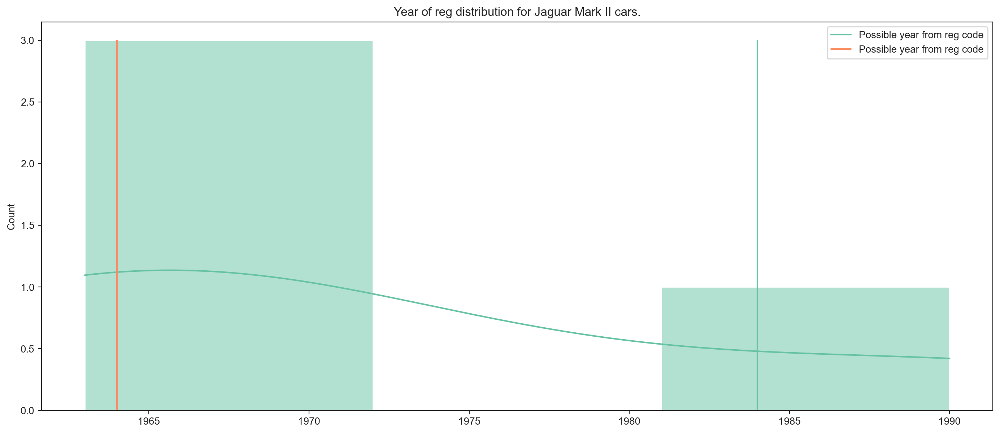

Mean year 2001.7
Closest year: 1996


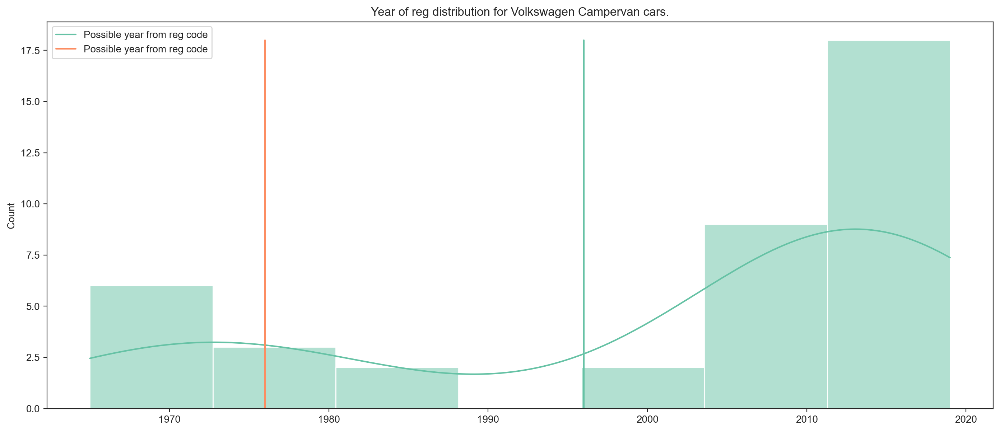

Mean year nan
Closest year: 1967


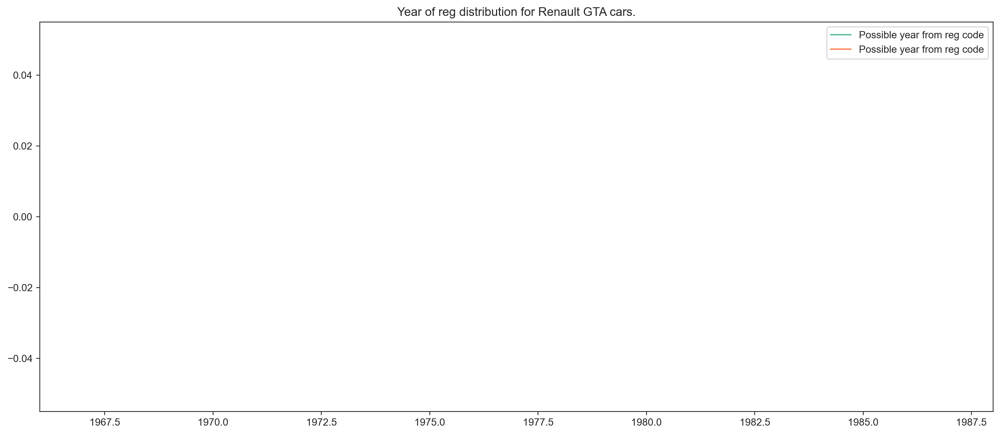

Mean year 2015.600145137881
Closest year: 1997


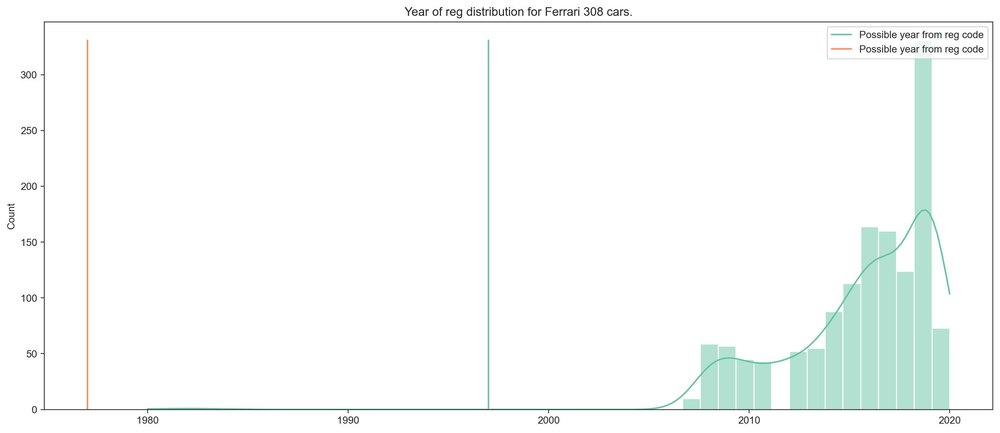

Mean year 2014.5841155234657
Closest year: 1997


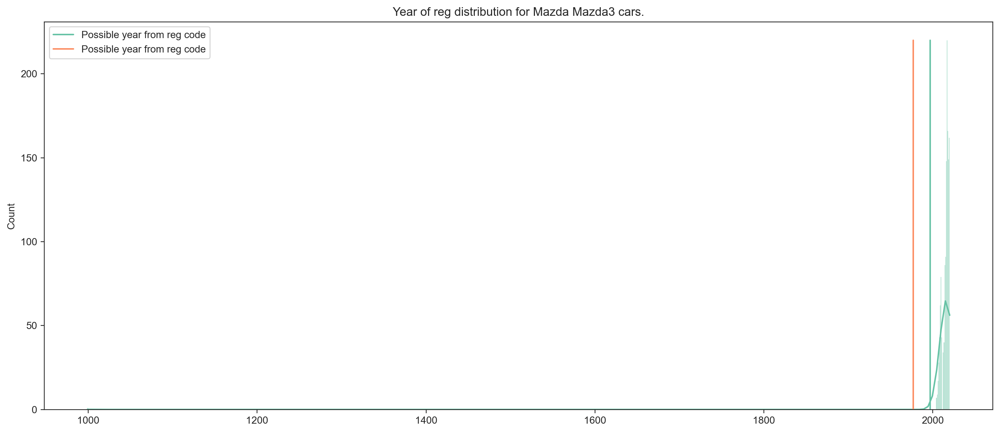

Mean year 2005.5
Closest year: 1993


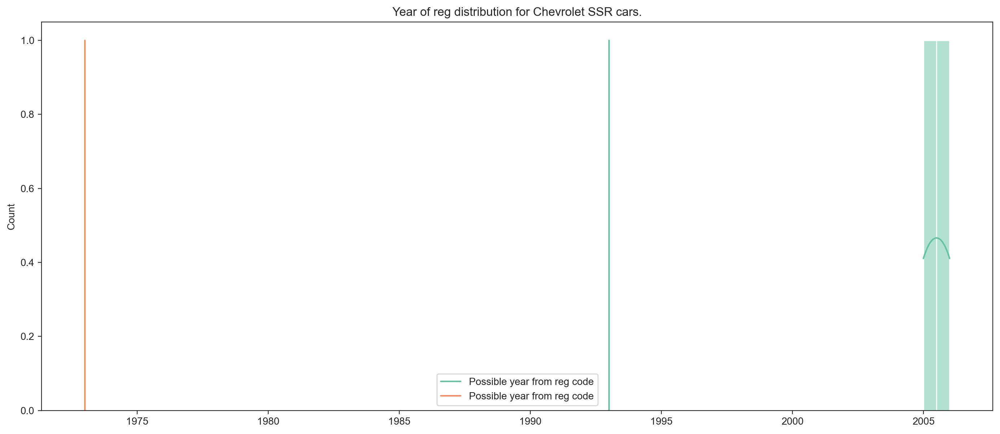

Mean year 1968.875
Closest year: 1967


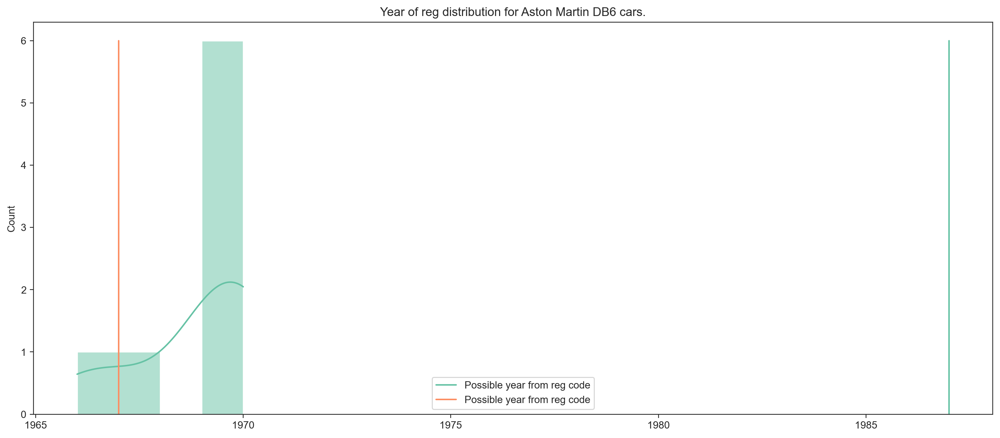

Mean year 1978.5
Closest year: 1984


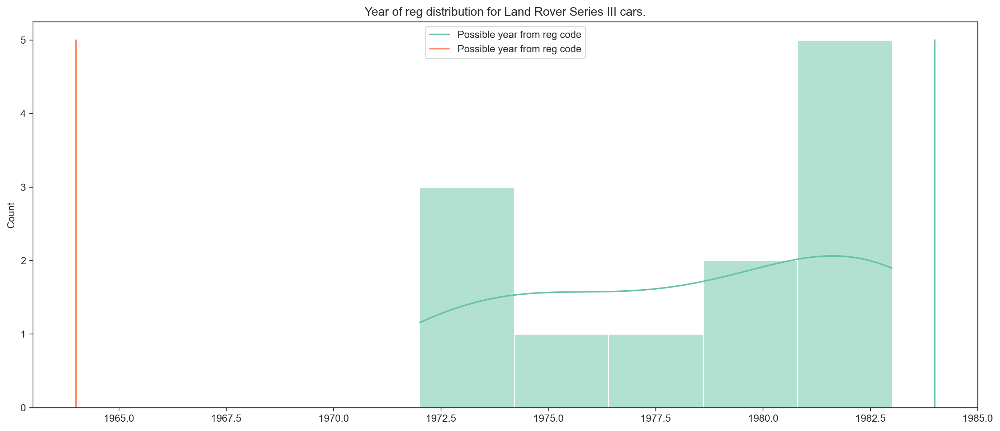

Mean year 2015.0565268065268
Closest year: 1987


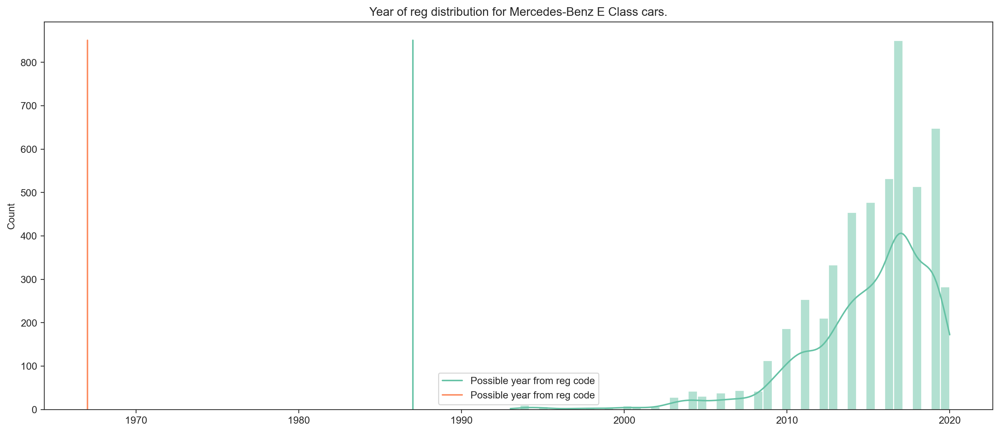

Mean year 2015.2166666666667
Closest year: 1985


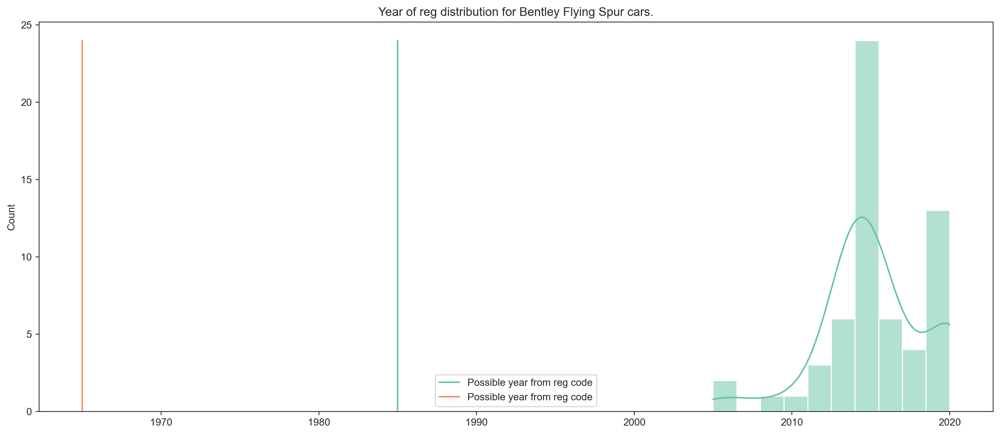

Mean year 2009.48664495114
Closest year: 2001


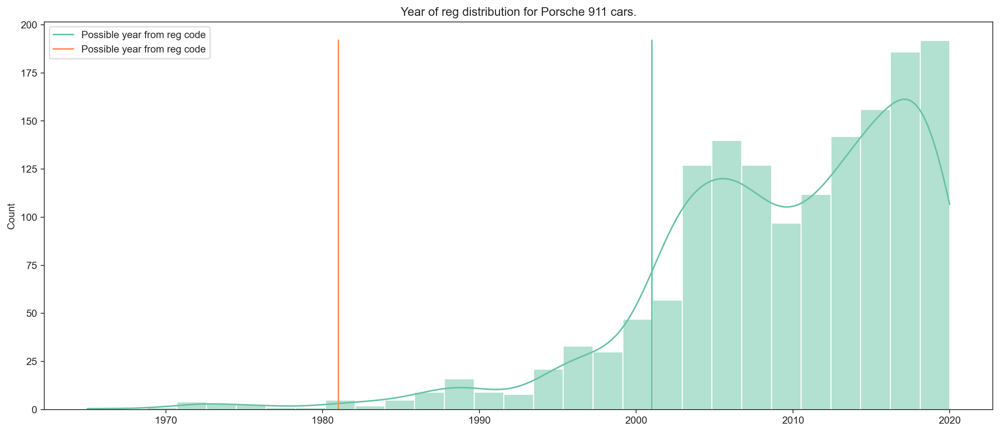

Mean year 2014.0355858648481
Closest year: 1993


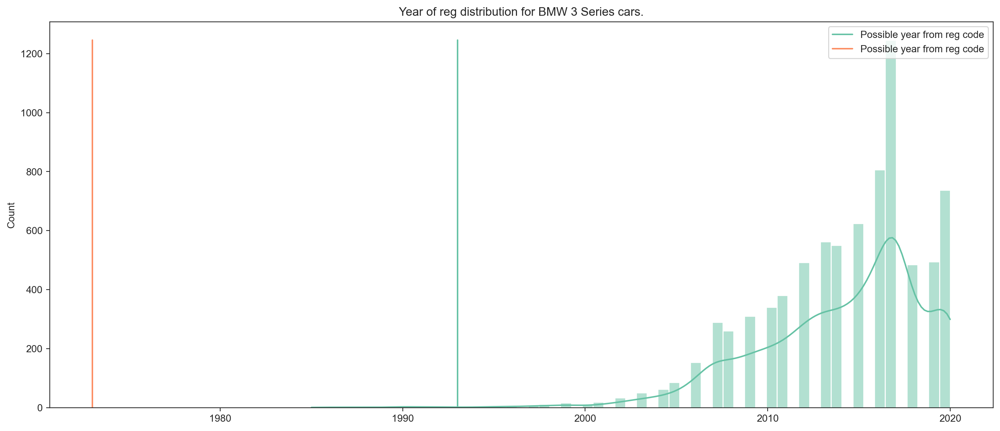

Mean year 2003.1818181818182
Closest year: 1997


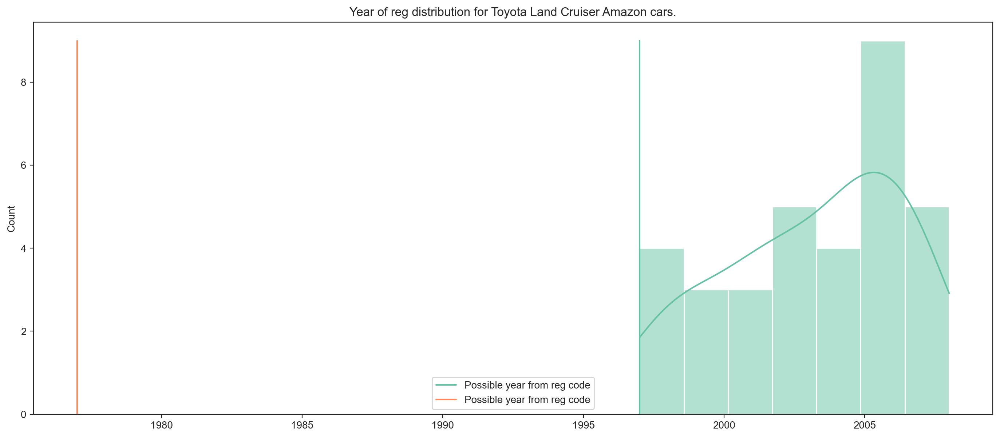

Mean year 1989.0
Closest year: 1987


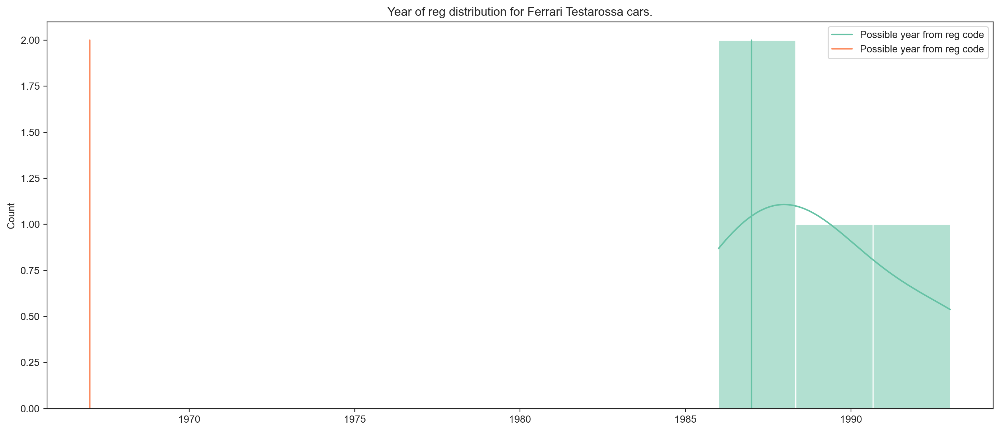

Mean year 1984.8333333333333
Closest year: 1994


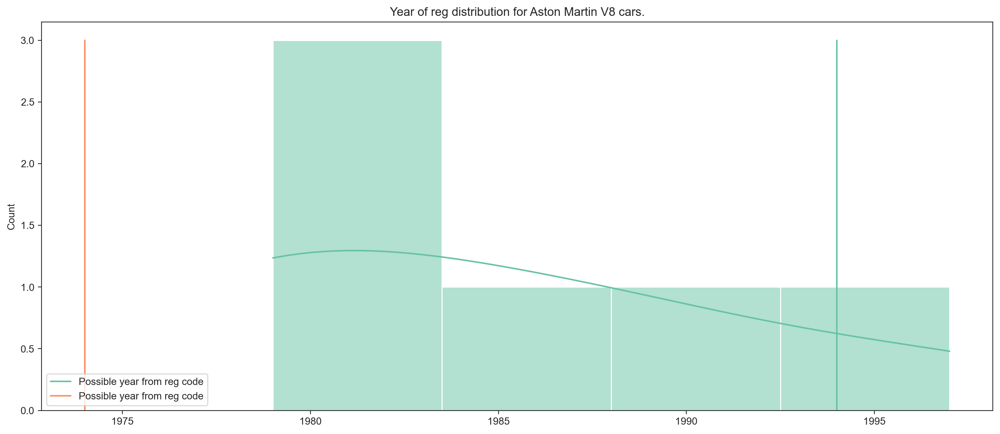

Mean year 2007.3977272727273
Closest year: 1991


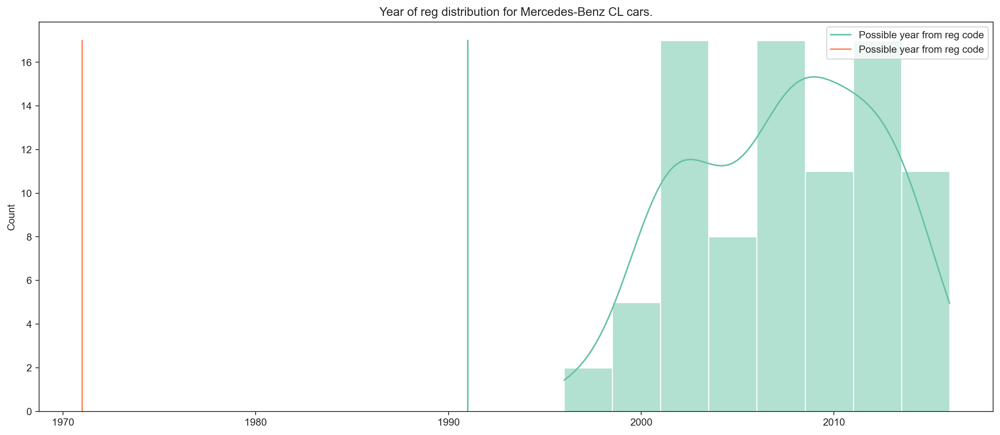

Mean year 2009.952
Closest year: 1990


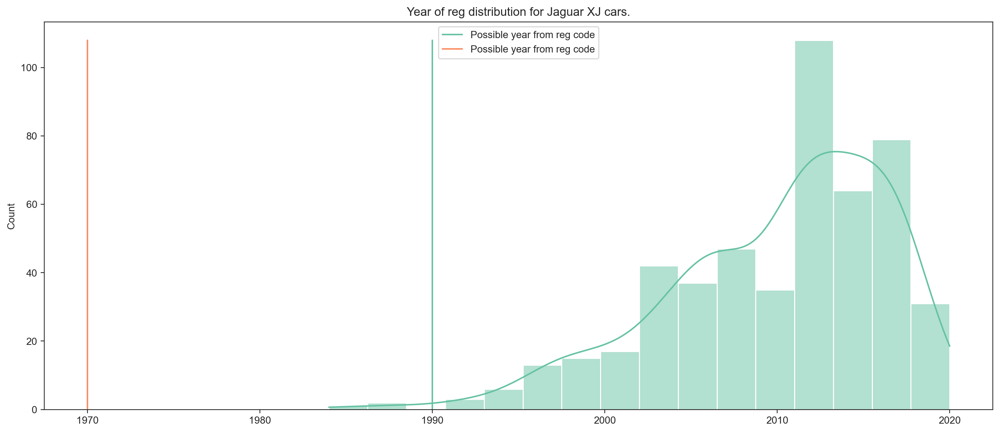

Mean year 1994.0
Closest year: 1998


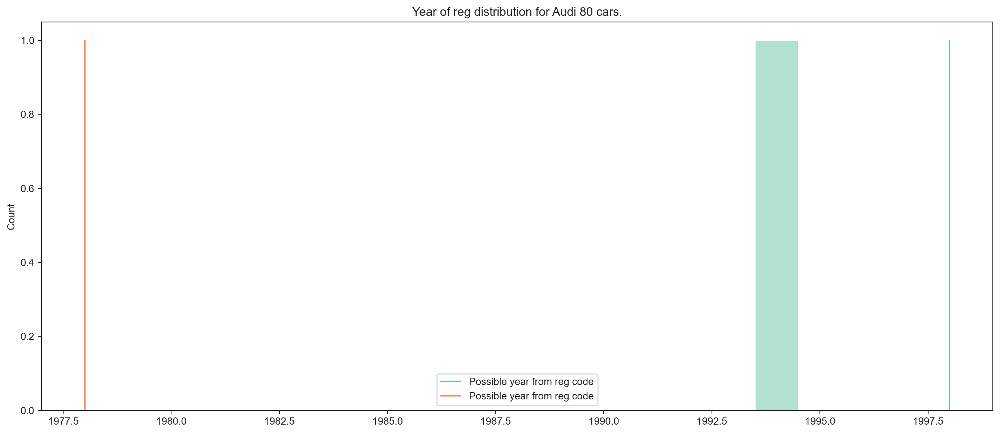

Mean year 1984.8333333333333
Closest year: 1975


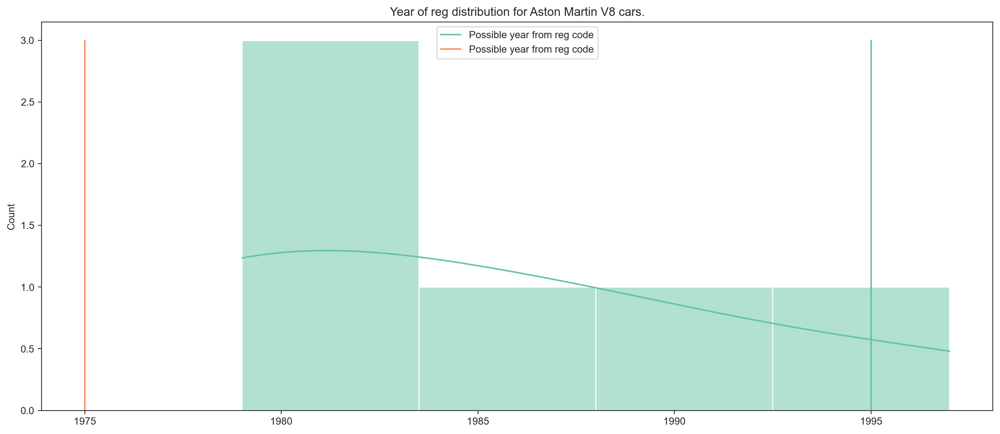

Mean year 2014.7767591107036
Closest year: 1988


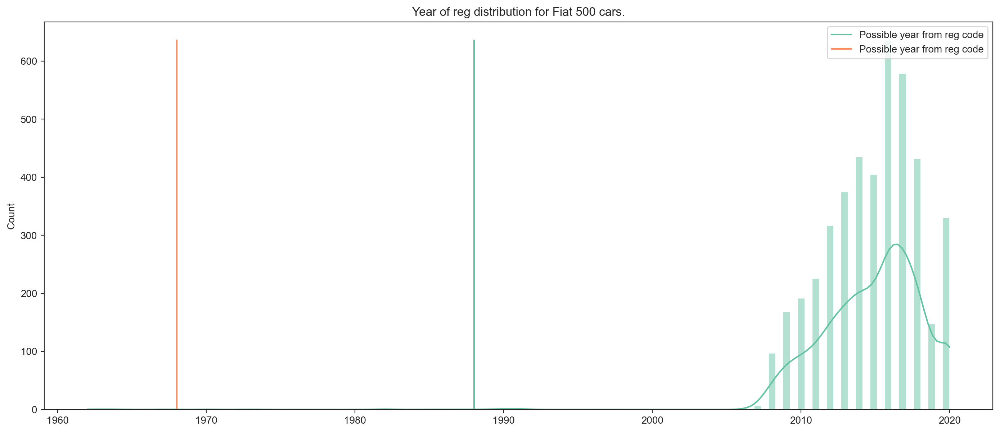

Mean year 2009.48664495114
Closest year: 1999


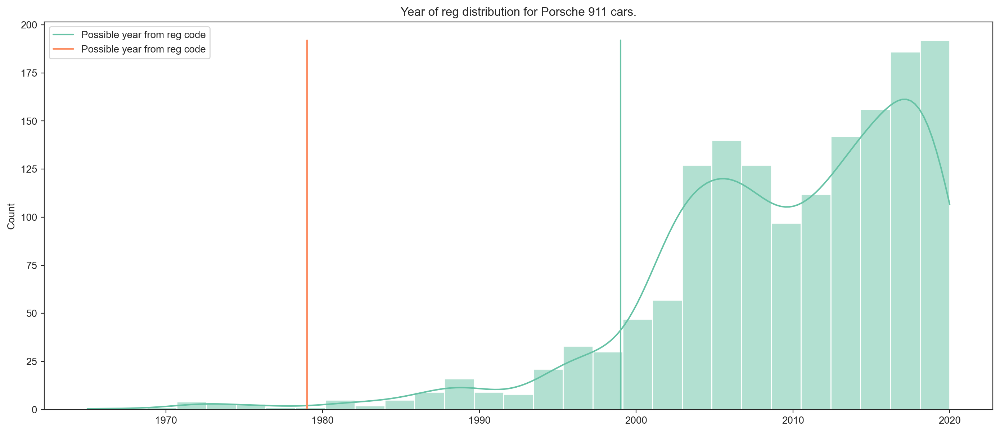

Mean year 2009.48664495114
Closest year: 1995


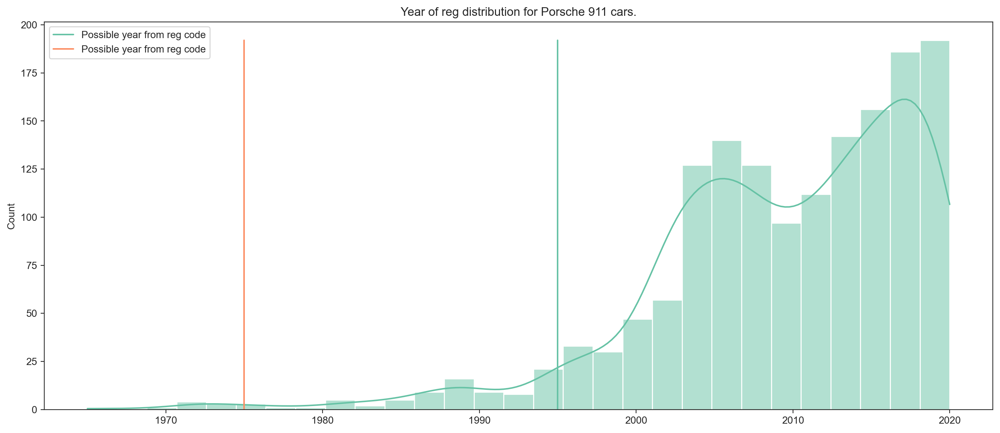

Mean year 2015.0565268065268
Closest year: 1995


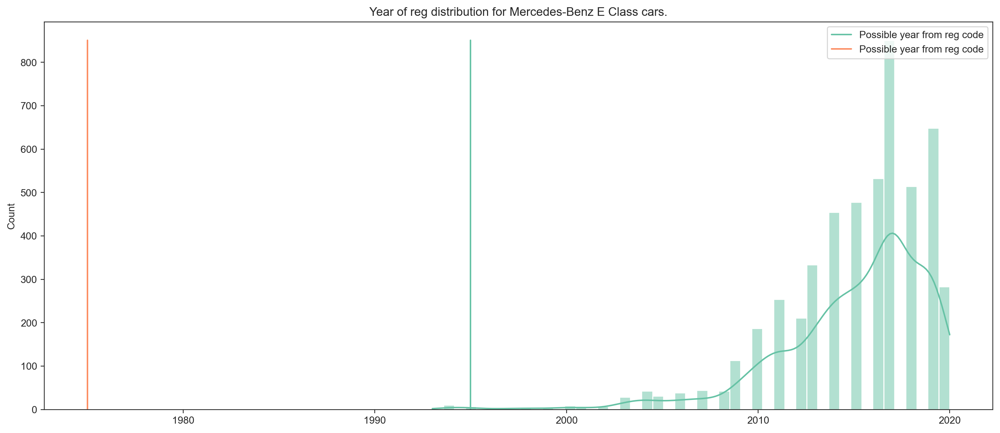

Mean year 2016.7956521739131
Closest year: 1987


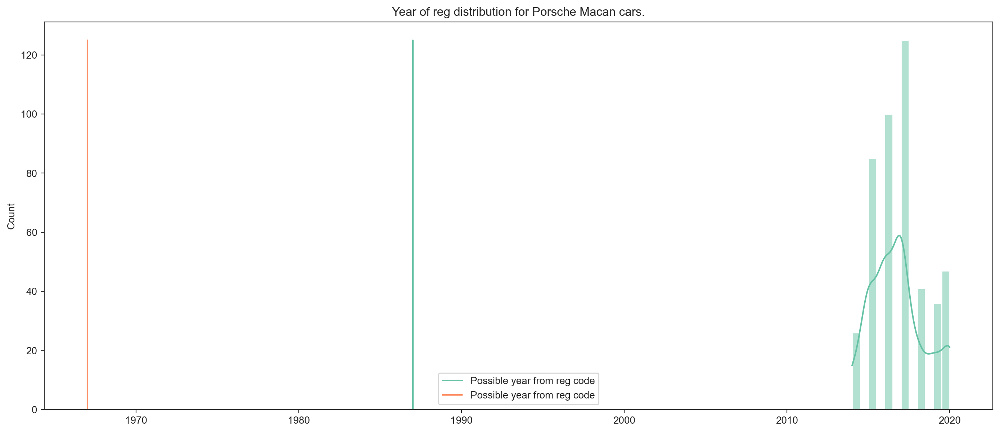

Mean year 2009.48664495114
Closest year: 1988


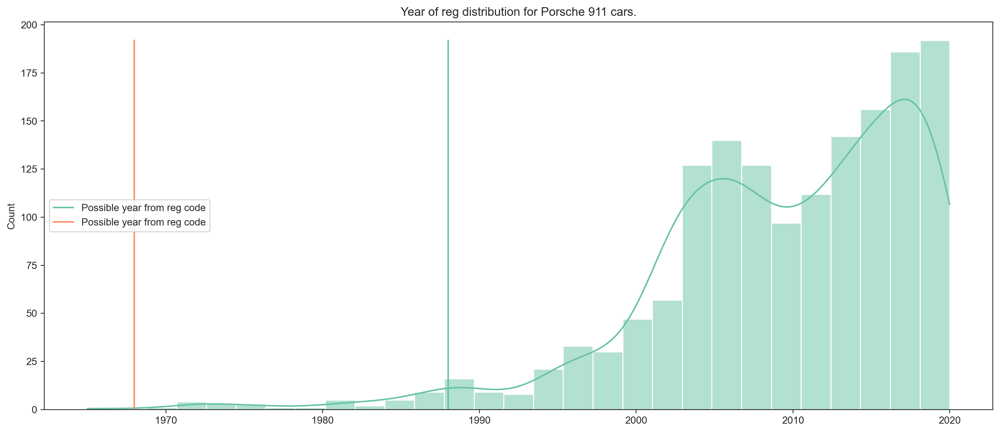

Mean year 2003.7021276595744
Closest year: 1998


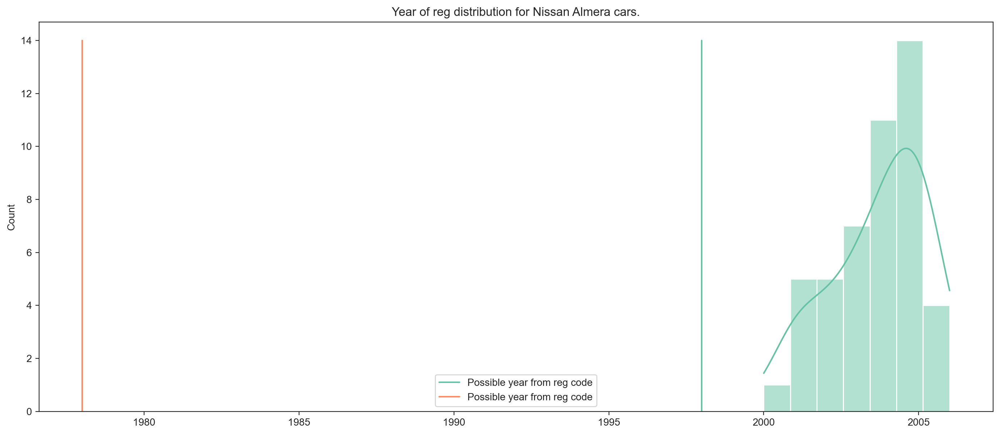

Mean year 1981.5
Closest year: 1974


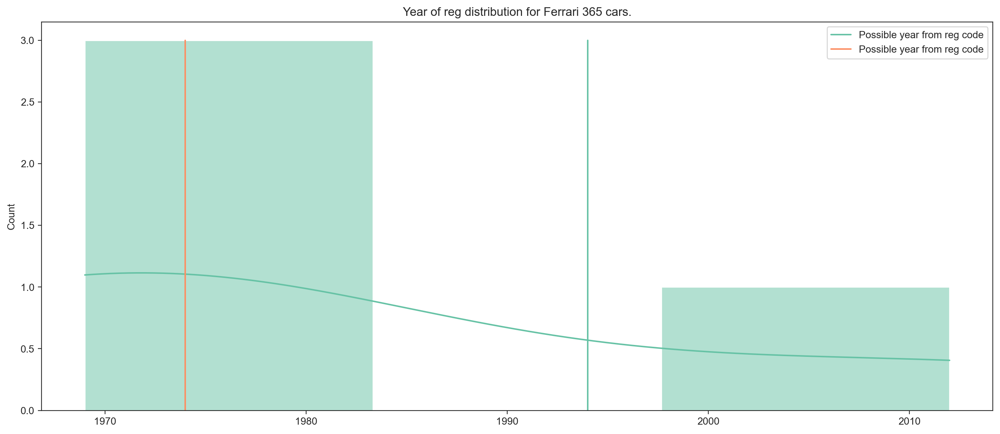

Mean year 2013.9285714285713
Closest year: 1999


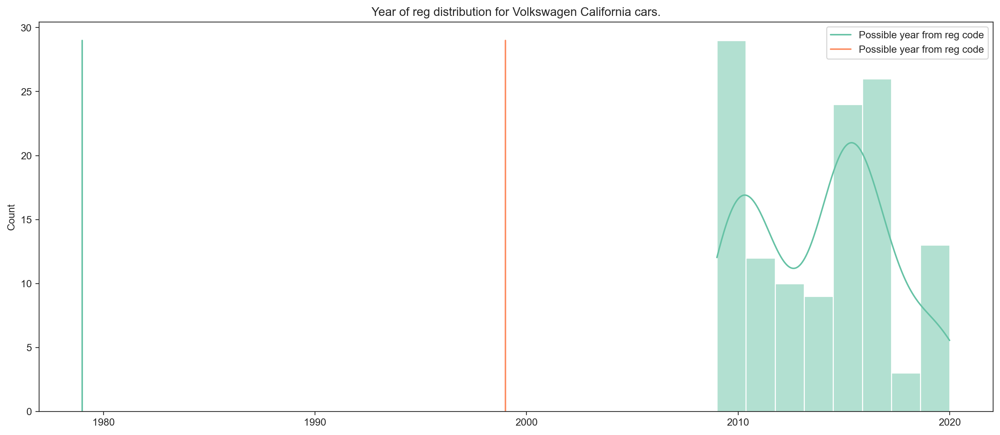

Mean year 1976.8
Closest year: 1973


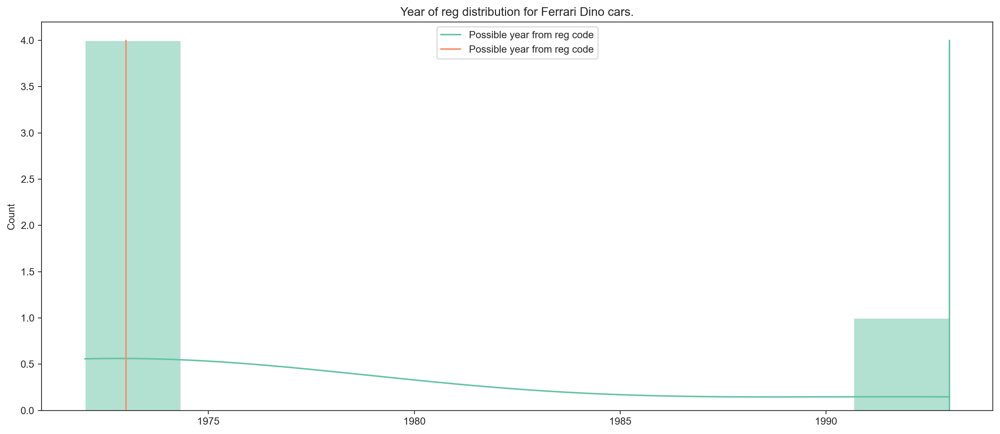

Mean year 1976.6666666666667
Closest year: 1974


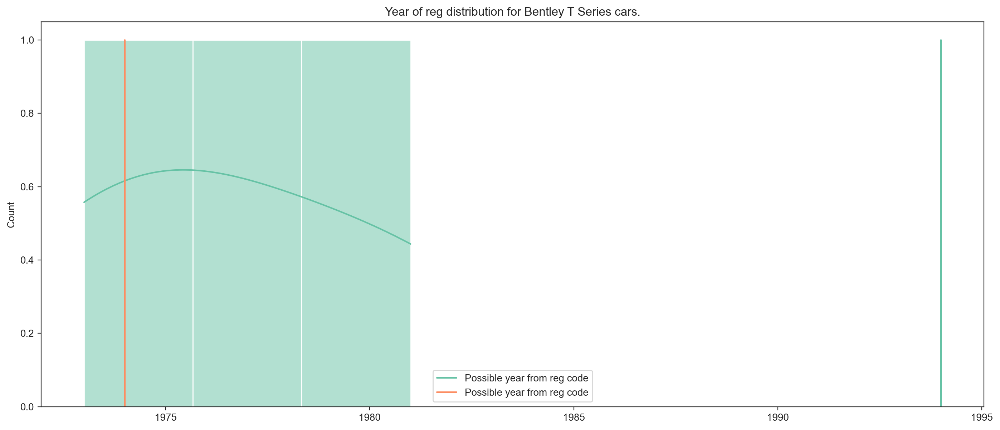

Mean year 2009.48664495114
Closest year: 1997


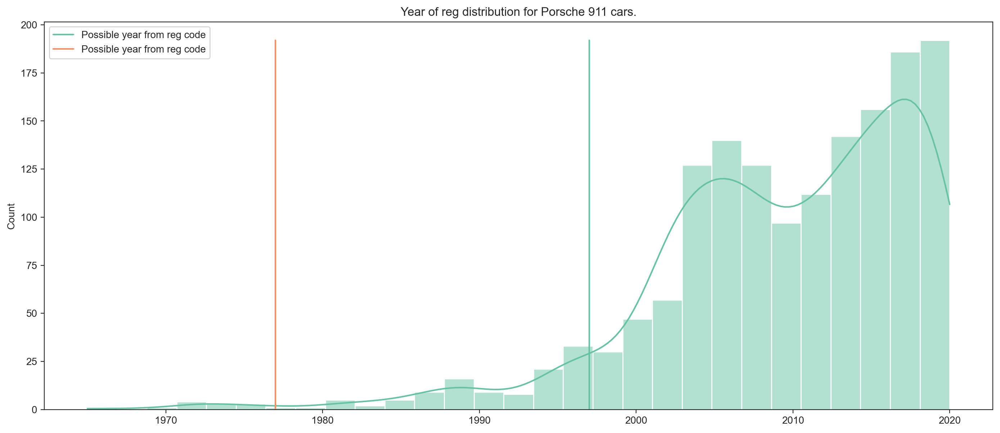

Mean year 1973.625
Closest year: 1977


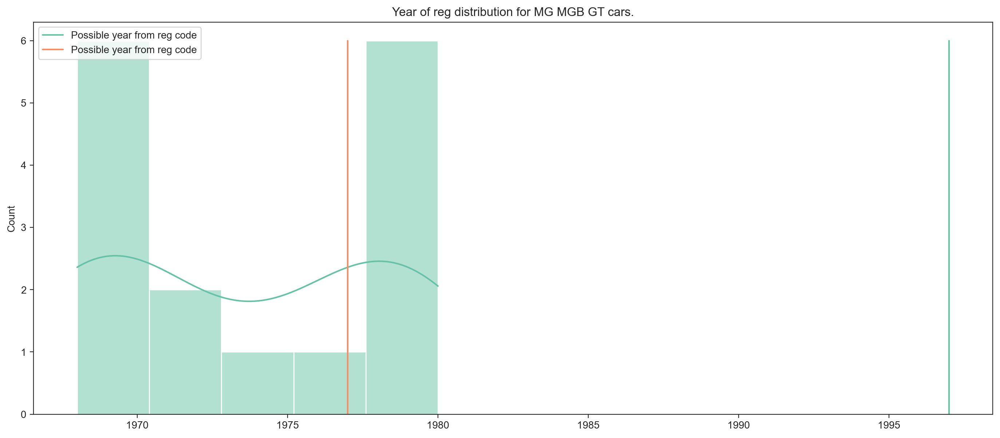

Mean year 1963.7272727272727
Closest year: 1969


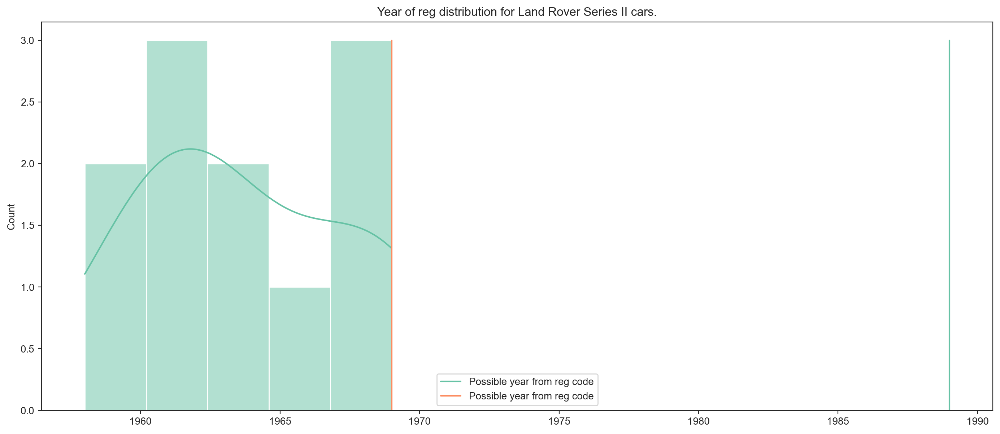

Mean year 1992.5
Closest year: 1988


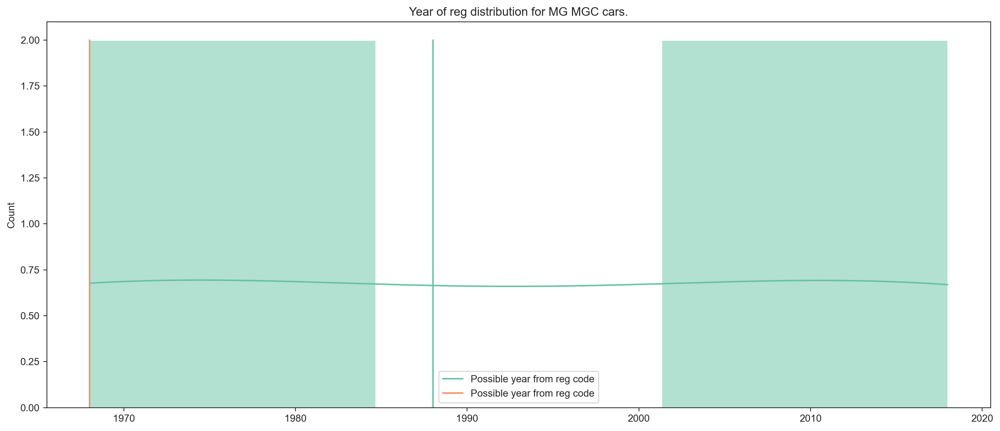

Mean year 2014.7767591107036
Closest year: 1990


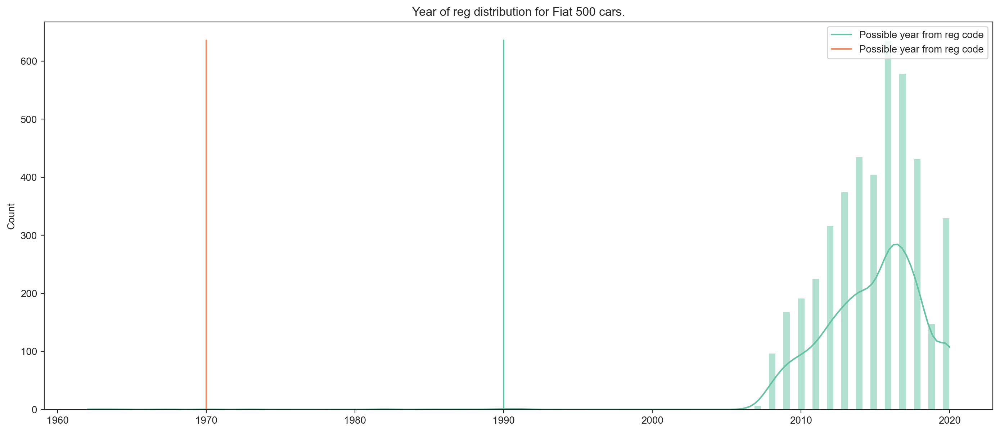

Mean year 1968.875
Closest year: 1966


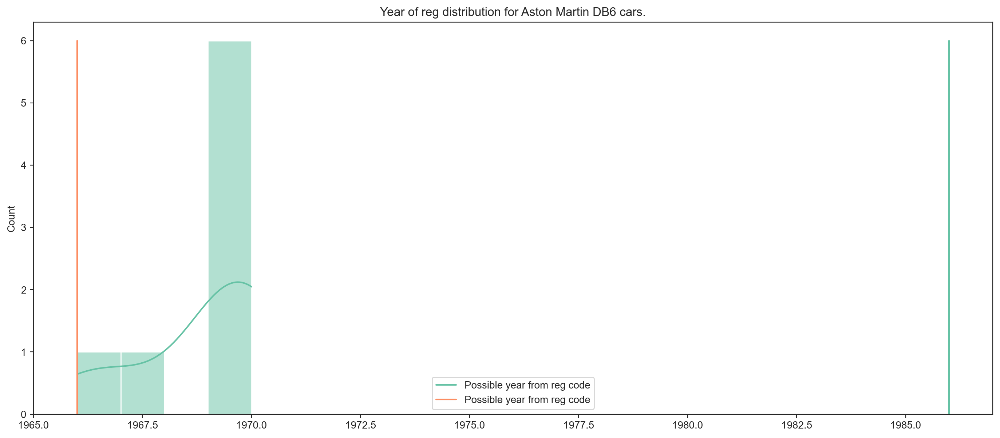

Mean year 1984.8333333333333
Closest year: 1979


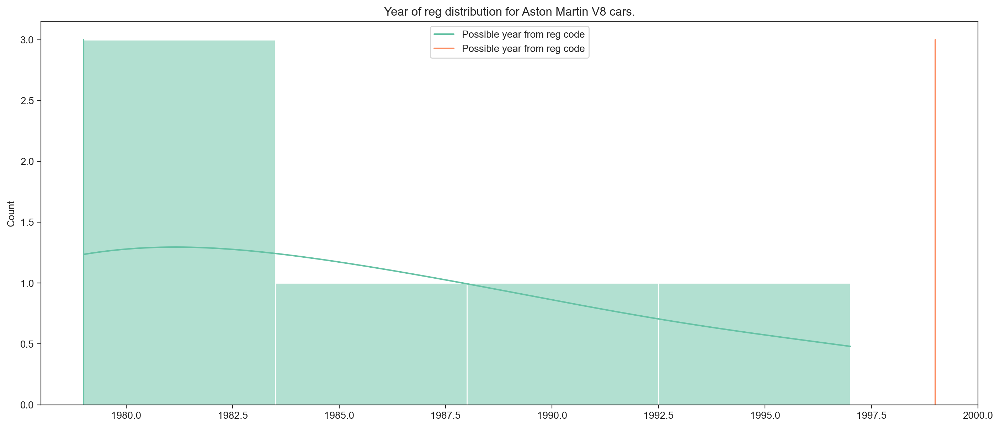

Mean year 2014.5878246299917
Closest year: 1989


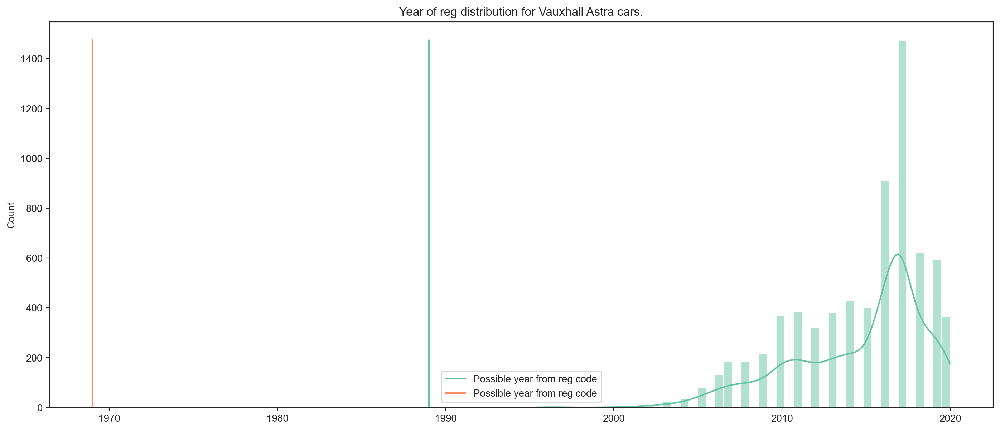

Mean year 1992.5
Closest year: 1994


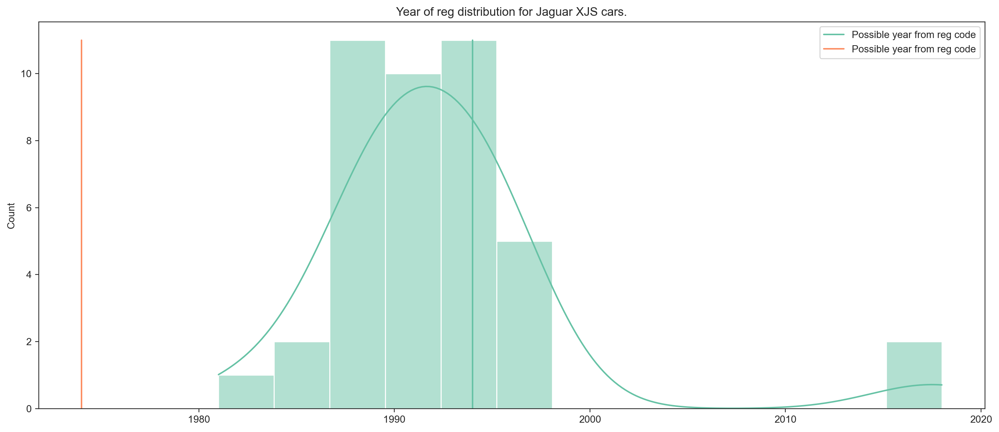

Mean year 2016.9329685362518
Closest year: 1999


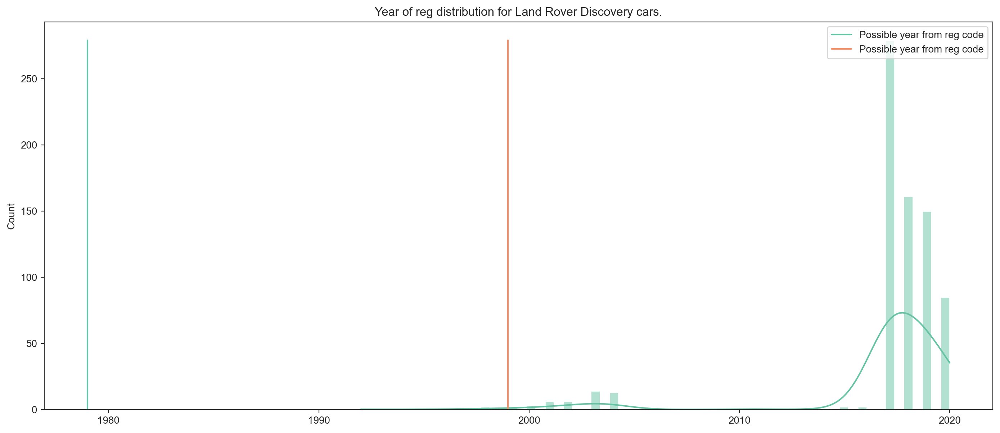

Mean year 1982.3333333333333
Closest year: 1983


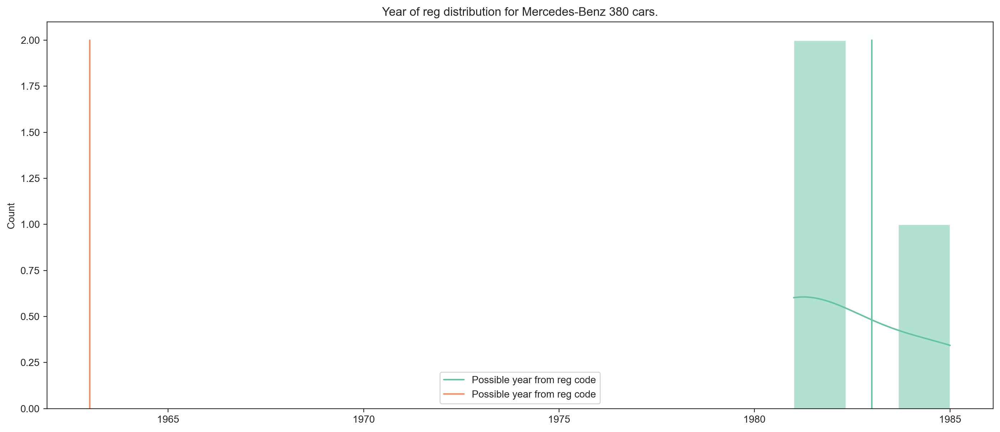

Mean year 2011.6500777604977
Closest year: 1999


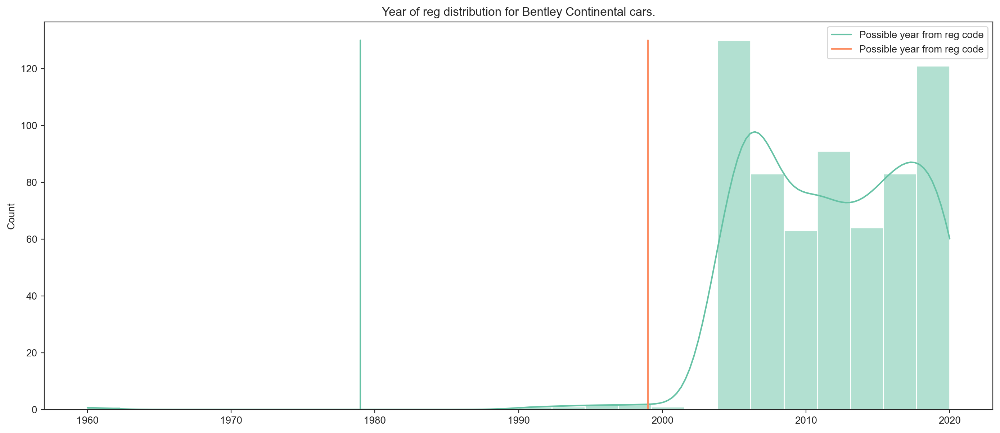

Mean year 2001.8333333333333
Closest year: 1994


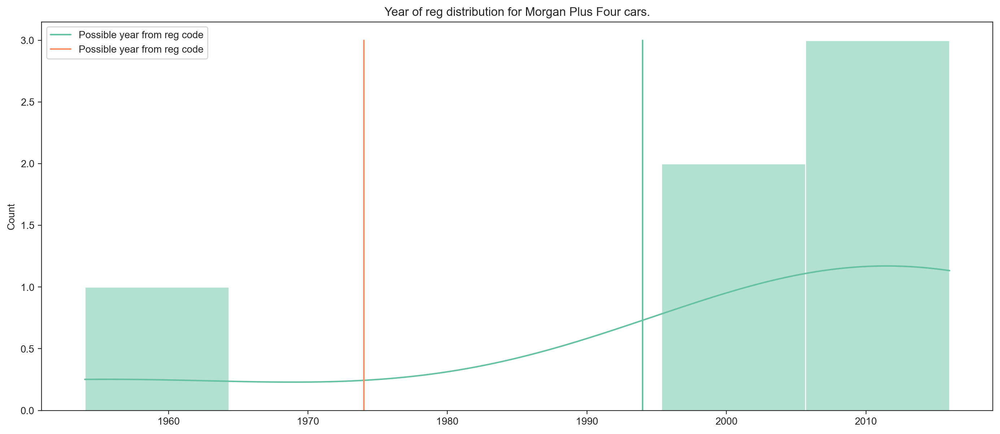

Mean year 1971.5
Closest year: 1966


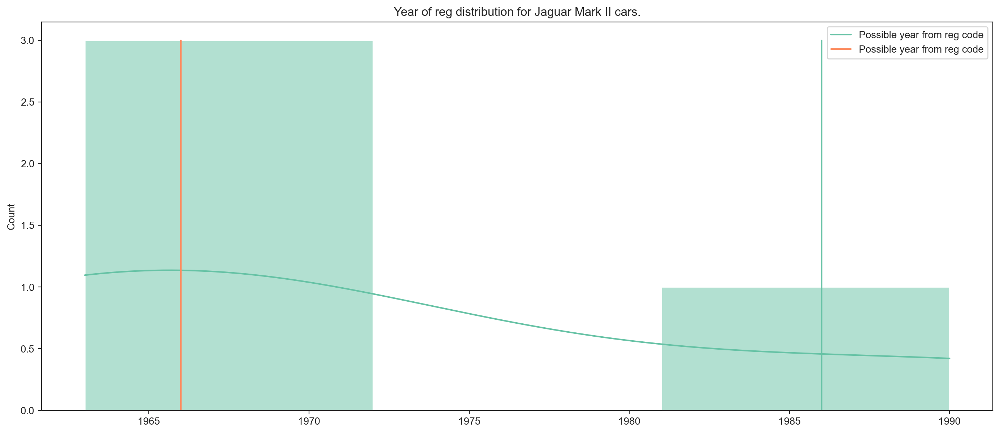

Mean year nan
Closest year: 1970


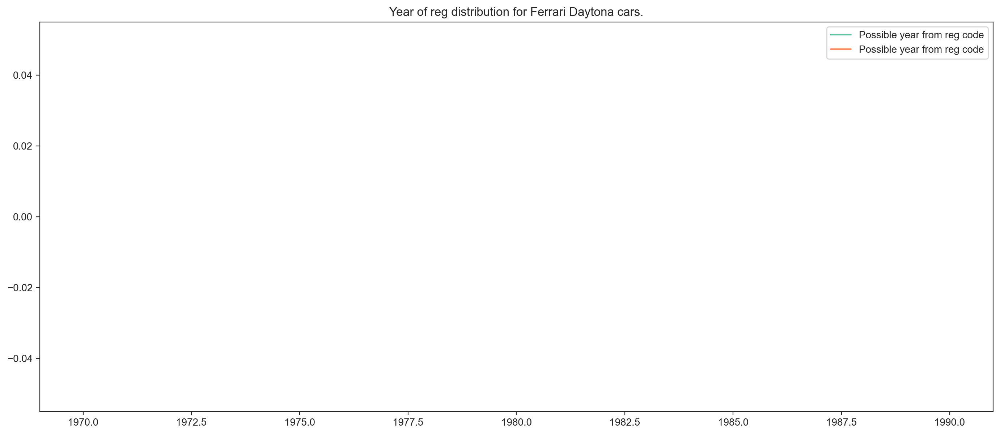

Mean year 2014.2816091954023
Closest year: 2001


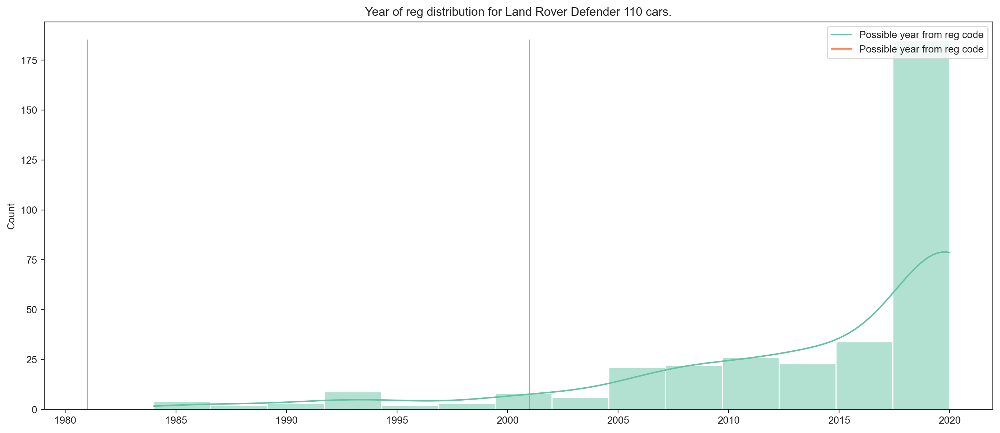

Mean year 2019.2068965517242
Closest year: 1996


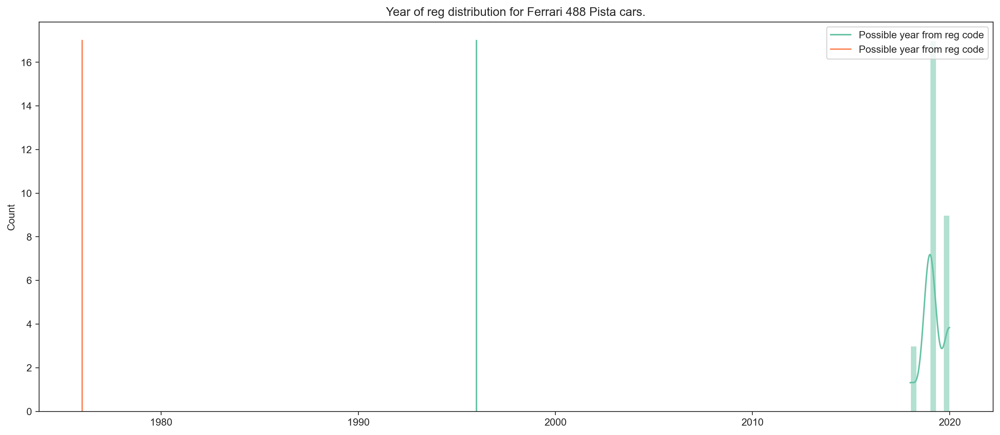

Mean year 1996.3333333333333
Closest year: 1986


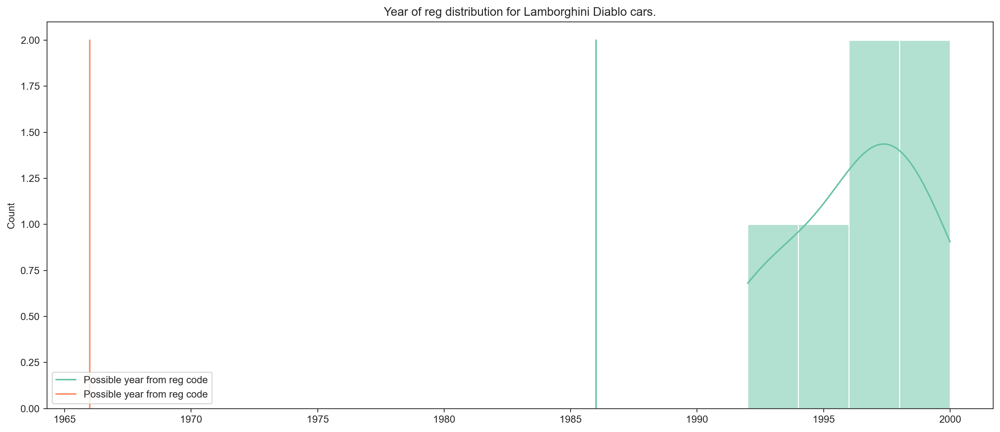

In [27]:
# For each ambiguous year visualise the distribution of years for vehicles of the same make
missing = missing.loc[missing["reg_code_year"].notna()]
full_missing = auto.loc[missing.index]

for i in range(len(full_missing)):
    missing_model = full_missing.iloc[i]["standard_model"]
    missing_make = full_missing.iloc[i]["standard_make"]
    years = full_missing.iloc[i]["reg_code_year"]
    used = auto.loc[(auto["standard_model"] == missing_model) & (auto["year_of_registration"].notna())]
    
    ax = sns.histplot(list(used["year_of_registration"]), kde=True)

    for year in years:
        plt.plot([year, year], [0, ax.dataLim.y1], label="Possible year from reg code")

    plt.title(f"Year of reg distribution for {missing_make} {missing_model} cars.");

    mean_year = np.array(used["year_of_registration"]).mean()
    closest_year = years[0] if abs(mean_year - years[0]) < abs(mean_year - years[1]) else years[1]
    print("Mean year", mean_year)
    print("Closest year:", closest_year)
    plt.legend()
    plt.show()

    auto.iat[full_missing.index[i], 12] = closest_year

In [28]:
auto.loc[full_missing.index]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,reg_code_year
10044,202003098187902,73330.0,B,Gold,Jaguar,Mark II,USED,NaN,24990.0,Saloon,False,Petrol,1964
16619,202010165086036,34000.0,P,Orange,Volkswagen,Campervan,USED,NaN,12500.0,Camper,False,Petrol,1996
28307,202003218665171,55400.0,E,White,Renault,GTA,USED,NaN,12495.0,Coupe,False,Petrol,1967
31566,202007040862151,26200.0,R,NaN,Ferrari,308,USED,NaN,124830.0,Coupe,False,Petrol,1997
50188,202009304378374,24500.0,R,Blue,Mazda,Mazda3,USED,NaN,13495.0,Hatchback,False,Petrol,1997
50961,202010215260465,49000.0,L,Blue,Chevrolet,SSR,USED,NaN,21500.0,Pickup,False,Bi Fuel,1993
78714,201912165366581,79800.0,E,Green,Aston Martin,DB6,USED,NaN,635000.0,Convertible,False,Petrol,1967
85202,202009234126186,99123.0,B,Green,Land Rover,Series III,USED,NaN,12000.0,Pickup,True,Petrol,1984
95640,202010215267071,55389.0,E,Grey,Mercedes-Benz,E Class,USED,NaN,25990.0,Coupe,False,Diesel,1987
105172,201905077698508,43098.0,C,Red,Bentley,Flying Spur,USED,NaN,150000.0,Saloon,False,Petrol,1985


In [29]:
# Replace reg_code_year values with year_of_registration values where year_of_registration is not null
auto['reg_code_year'] = auto['year_of_registration'].combine_first(auto['reg_code_year'])
# Replace year_of_registration values with reg_code_year values where year_of_registration is null
auto['year_of_registration'] = auto['year_of_registration'].combine_first(auto['reg_code_year'])

auto.loc[auto["year_of_registration"].isna()]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,reg_code_year
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970.0,SUV,False,Petrol Plug-in Hybrid,NaN
17,201911043995897,5.0,NaN,NaN,Nissan,X-Trail,NEW,NaN,27595.0,SUV,False,Diesel,NaN
19,202008272998331,0.0,NaN,White,Volkswagen,T-Cross,NEW,NaN,25000.0,SUV,False,Petrol,NaN
37,202001306737473,0.0,NaN,White,Fiat,Panda,NEW,NaN,13999.0,Hatchback,False,Petrol,NaN
44,202003178531910,0.0,NaN,NaN,Honda,Civic,NEW,NaN,19495.0,Hatchback,False,Petrol,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
401860,202010024501227,10.0,NaN,Silver,Mitsubishi,Shogun Sport,NEW,NaN,31999.0,SUV,False,Diesel,NaN
401890,202010104843364,5.0,NaN,Red,BMW,Z4,NEW,NaN,47910.0,Convertible,False,Petrol,NaN
401902,202010134960554,10.0,NaN,White,BMW,3 Series,NEW,NaN,35023.0,Saloon,False,Petrol,NaN
401905,202010144983518,0.0,NaN,Red,Land Rover,Range Rover Evoque,NEW,NaN,44995.0,SUV,False,Petrol,NaN


In [30]:
notnan = auto.loc[auto["year_of_registration"].notna()]
notnan = notnan.loc[notnan["reg_code_year"].notna()]
notnan["reg_code_year"] = notnan["reg_code_year"].map(lambda f: int(f))
notnan["year_of_registration"] = notnan["year_of_registration"].map(lambda f: int(f))
mismatch = notnan.loc[abs(notnan["year_of_registration"] - notnan["reg_code_year"]) > 1]

Most of the reg codes can be mapped simply to years, however, there are cases where they disagree or the mapping is more complex. Below I identify these mismatches for known years of reg for further examination.

In [31]:
mismatch = auto.loc[mismatch.index]
mismatch.loc[mismatch["year_of_registration"] > 2000]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,reg_code_year


Modern cars should not have letter reg codes. This means either the year is incorrect or the registration plate does not match the usual format. This could be due to a custom or foreign reg. As such, the year of reg will be trusted and the reg_code ignored. 

In [32]:
unusual_reg = auto[(auto['reg_code'].apply(is_alpha)) & (auto["year_of_registration"] > 2001)]

unusual_reg

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,reg_code_year
2441,202009043309414,158000.0,V,Blue,Audi,A3,USED,2017.0,1995.0,Hatchback,False,Diesel,2017.0
16268,202010034572199,45000.0,H,Grey,Land Rover,Range Rover Sport,USED,2017.0,37750.0,SUV,False,Diesel,2017.0
24287,201909142224514,55000.0,S,Green,Daimler,Super Eight,USED,2019.0,10995.0,Saloon,False,Petrol,2019.0
64548,202010235367626,96000.0,E,Grey,Volkswagen,Karmann,USED,2006.0,35000.0,Coupe,False,Petrol,2006.0
70814,202009294330268,20000.0,Y,Yellow,Mercedes-Benz,G Class,USED,2014.0,149950.0,SUV,False,Petrol,2014.0
114407,202008011962624,124000.0,M,Purple,Volkswagen,Golf,USED,2008.0,645.0,NaN,False,NaN,2008.0
118355,201801283171568,90000.0,m,Red,Mitsubishi,GTO,USED,2005.0,5989.0,Coupe,False,Petrol,2005.0
133006,202005209439981,66000.0,M,Black,Porsche,911,USED,2016.0,99950.0,Coupe,False,Petrol,2016.0
134313,201908281578365,36000.0,M,Yellow,Jaguar,E-Type,USED,2019.0,59950.0,Convertible,False,Petrol,2019.0
155766,202006140117828,86527.0,Y,Silver,Mazda,MX-5,USED,2003.0,1550.0,Convertible,False,Petrol,2003.0


In [33]:
# Sample some reg codes to investigate
sample = auto.sample()
print(format_entry(sample))
print(sample["reg_code"].values[0])

2012 Renault Clio with 46,700 miles and price £3,675.0
12


Some reg codes which correspond to the second half of one year have the year of registration one year later. This seems fine and the year of registration will be taken as valid in this case.

Letter registration codes introduce ambiguity as there is no delineation made between 1963-1983 letter codes (A-Y at the end of the reg) and 1983-2000 codes which reuse the same letters but at the start of the reg.

## Reg Code Summary

The reg codes are useful to impute the year of registration, beyond this they are redundant to the year and this column should be dropped before fitting. Some reg codes are ambiguous and need to be estimated based on the average year of registration of other cars of the same make. Additional information such as the mileage could also be useful to improve the imputing so something like a KNN imputer give slightly better results. A few reg codes do not fit with a known pattern, having values which put the year in the future (based on when the data was gathered) or having letters (or strings) which do not map to known year codes and as such are of no value and should be ignored.

---
&nbsp;

&nbsp;

# ==== Year of Registration ====

In [34]:
years = auto["year_of_registration"].unique()
years.sort()
years

array([nan, 999.0, 1006.0, 1007.0, 1008.0, 1009.0, 1010.0, 1015.0, 1016.0,
       1017.0, 1018.0, 1063.0, 1515.0, 1909.0, 1933.0, 1934.0, 1950.0,
       1952.0, 1954.0, 1955.0, 1956.0, 1957.0, 1958.0, 1959.0, 1960.0,
       1961.0, 1962.0, 1963.0, 1964, 1965.0, 1966.0, 1967.0, 1968.0,
       1969.0, 1970.0, 1971.0, 1972.0, 1973.0, 1974.0, 1975.0, 1976.0,
       1977.0, 1978.0, 1979.0, 1980.0, 1981.0, 1982.0, 1983.0, 1984.0,
       1985.0, 1986.0, 1987.0, 1988.0, 1989.0, 1990.0, 1991.0, 1992.0,
       1993.0, 1994.0, 1995.0, 1996.0, 1997.0, 1998.0, 1999.0, 2000.0,
       2001.0, 2002.0, 2003.0, 2004.0, 2005.0, 2006.0, 2007.0, 2008.0,
       2009.0, 2010.0, 2011.0, 2012.0, 2013.0, 2014.0, 2015.0, 2016.0,
       2017.0, 2018.0, 2019.0, 2020.0], dtype=object)

In [35]:
# Some very small years, lets have a look

auto.loc[auto["year_of_registration"] < 1950].sort_values(by="year_of_registration", ascending=False)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,reg_code_year
156562,202009264242828,48000.0,FW,Black,Morris,10,USED,1934.0,5995.0,Saloon,False,Petrol,1934.0
28925,202006140121316,26000.0,NaN,Black,Austin,Seven,USED,1933.0,9995.0,Saloon,False,Petrol,1933.0
150850,202006220401450,12345.0,NaN,Black,Austin,Twelve,USED,1933.0,11990.0,Saloon,False,Petrol,1933.0
148003,202010104836987,31172.0,09,Black,Hyundai,i10,USED,1909.0,3950.0,Hatchback,False,Petrol,1909.0
69516,202010155035879,96659.0,65,Black,Audi,A4 Avant,USED,1515.0,10385.0,Estate,False,Diesel,1515.0
84501,202009163810376,37771.0,63,Black,Smart,fortwo,USED,1063.0,4785.0,Coupe,False,Petrol,1063.0
201616,202010134937656,8600.0,68,Silver,BMW,M2,USED,1018.0,41990.0,Coupe,False,Petrol,1018.0
274622,202010024511934,6353.0,17,Blue,BMW,2 Series,USED,1017.0,18990.0,Convertible,False,Petrol,1017.0
120858,202010064654489,27200.0,66,Black,MINI,Clubman,USED,1016.0,18990.0,Estate,False,Diesel,1016.0
387633,202010195174849,39624.0,65,Red,MINI,Clubman,USED,1015.0,15290.0,Estate,False,Petrol,1015.0


Austin and Morris make sense to have years in the 1930 however, the others predate the invention of the car and 
look to be off by 1000 except the Audi A4 Avant with year 1515 and the Hyundai i10 with year 1909. Fortunately, all of them have reasonable reg_codes which can be used to impute the year. I will replace these invalid values with nan so that the reg_code function can replace them correctly.

In [36]:
auto["year_of_registration"] = auto["year_of_registration"].mask(auto["year_of_registration"] < 1910)
years = auto["year_of_registration"].unique()
years.sort()
years

array([nan, 1933.0, 1934.0, 1950.0, 1952.0, 1954.0, 1955.0, 1956.0,
       1957.0, 1958.0, 1959.0, 1960.0, 1961.0, 1962.0, 1963.0, 1964,
       1965.0, 1966.0, 1967.0, 1968.0, 1969.0, 1970.0, 1971.0, 1972.0,
       1973.0, 1974.0, 1975.0, 1976.0, 1977.0, 1978.0, 1979.0, 1980.0,
       1981.0, 1982.0, 1983.0, 1984.0, 1985.0, 1986.0, 1987.0, 1988.0,
       1989.0, 1990.0, 1991.0, 1992.0, 1993.0, 1994.0, 1995.0, 1996.0,
       1997.0, 1998.0, 1999.0, 2000.0, 2001.0, 2002.0, 2003.0, 2004.0,
       2005.0, 2006.0, 2007.0, 2008.0, 2009.0, 2010.0, 2011.0, 2012.0,
       2013.0, 2014.0, 2015.0, 2016.0, 2017.0, 2018.0, 2019.0, 2020.0],
      dtype=object)

<Axes: xlabel='year_of_registration'>

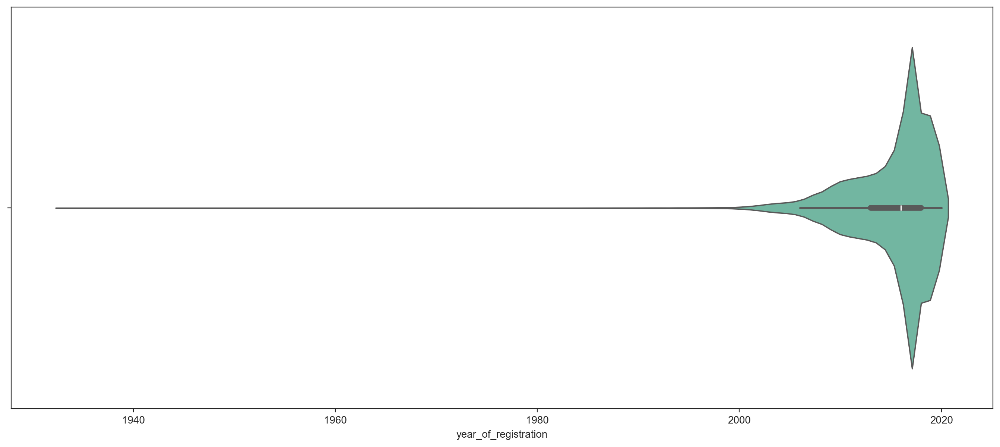

In [37]:
sns.violinplot(auto, x="year_of_registration")

## Null Values

In [38]:
print(f"There are {len(auto["year_of_registration"].isna())} null values for year of reg.")
print(f"There are {len(auto.loc[(auto["year_of_registration"].isna()) & (auto["reg_code"].isna())])} null values for year of reg with no corresponding reg code.")

There are 402005 null values for year of reg.
There are 31570 null values for year of reg with no corresponding reg code.


A large number of the missing years have reg codes which can be used ot fill in the gaps however, there are still 31570 nulls.

In [39]:
# All missing year entries
auto.loc[(auto["year_of_registration"].isna()) & (auto["reg_code"].isna())]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,reg_code_year
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970.0,SUV,False,Petrol Plug-in Hybrid,NaN
17,201911043995897,5.0,NaN,NaN,Nissan,X-Trail,NEW,NaN,27595.0,SUV,False,Diesel,NaN
19,202008272998331,0.0,NaN,White,Volkswagen,T-Cross,NEW,NaN,25000.0,SUV,False,Petrol,NaN
37,202001306737473,0.0,NaN,White,Fiat,Panda,NEW,NaN,13999.0,Hatchback,False,Petrol,NaN
44,202003178531910,0.0,NaN,NaN,Honda,Civic,NEW,NaN,19495.0,Hatchback,False,Petrol,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
401860,202010024501227,10.0,NaN,Silver,Mitsubishi,Shogun Sport,NEW,NaN,31999.0,SUV,False,Diesel,NaN
401890,202010104843364,5.0,NaN,Red,BMW,Z4,NEW,NaN,47910.0,Convertible,False,Petrol,NaN
401902,202010134960554,10.0,NaN,White,BMW,3 Series,NEW,NaN,35023.0,Saloon,False,Petrol,NaN
401905,202010144983518,0.0,NaN,Red,Land Rover,Range Rover Evoque,NEW,NaN,44995.0,SUV,False,Petrol,NaN


Many of these cars with missing years are new. New cars have likely not been registered yet but as they are new we can fill in the current year (as of when the data was collected, 2020) for the year_of_registration.

In [40]:
# Not new missing year entries
auto.loc[(auto["year_of_registration"].isna()) & (auto["reg_code"].isna()) & (auto["vehicle_condition"] != "NEW")].sort_values(by="price")

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,reg_code_year
185690,202009244151758,134000.0,NaN,Blue,Vauxhall,Corsa,USED,NaN,1250.0,NaN,False,Diesel,NaN
23752,202010024491962,110000.0,NaN,Beige,BMW,X5,USED,NaN,2250.0,SUV,False,NaN,NaN
246942,202009284314499,163000.0,NaN,Silver,Land Rover,Freelander,USED,NaN,2486.0,SUV,False,Diesel,NaN
71508,202010064666671,171000.0,NaN,Blue,Chrysler,Sebring,USED,NaN,2495.0,Convertible,False,Petrol,NaN
324667,202010134929324,73897.0,NaN,Grey,Honda,Civic,USED,NaN,2689.0,Hatchback,False,Petrol,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
147188,202009103539048,100.0,NaN,Grey,Maserati,3500,USED,NaN,NaN,Convertible,False,Petrol,NaN
252505,202008112331147,46300.0,NaN,Blue,Ferrari,275,USED,NaN,NaN,Coupe,False,Petrol,NaN
305436,201812223434109,3600.0,NaN,Grey,Lamborghini,Miura,USED,NaN,NaN,Coupe,False,Petrol,NaN
336202,202001226429470,950.0,NaN,Black,Ferrari,LaFerrari,USED,NaN,NaN,Coupe,False,Petrol,NaN


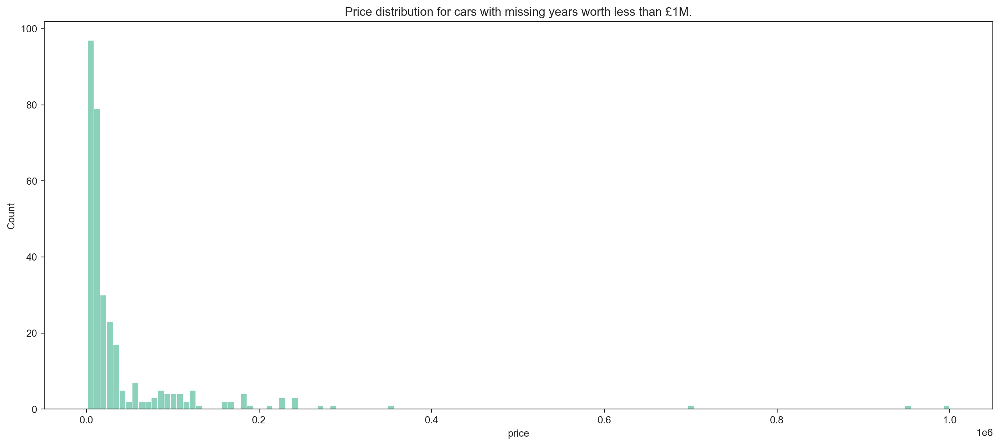

In [41]:
miss = auto.loc[(auto["year_of_registration"].isna()) & (auto["reg_code"].isna()) & (auto["vehicle_condition"] != "NEW")]
miss = miss.loc[miss["price"] < 1e6]
sns.histplot(miss, x="price")
plt.title("Price distribution for cars with missing years worth less than £1M.");

This leaves 321 entries which need to have their year of reg imputed.

---
&nbsp;

&nbsp;

# ==== Colour ====

In [42]:
print(f"Colour has {int(auto["standard_colour"].isnull().sum())} null values.")

Colour has 5378 null values.


In [43]:
auto["standard_colour"].value_counts()

standard_colour
Black          86287
White          70535
Grey           68227
Blue           59784
Silver         49323
Red            42024
Green           4534
Orange          4088
Yellow          2097
Brown           2014
Multicolour     1854
Beige           1539
Bronze          1330
Purple          1211
Gold             818
Pink             410
Turquoise        307
Maroon           159
Burgundy          63
Magenta           15
Navy               7
Indigo             1
Name: count, dtype: int64

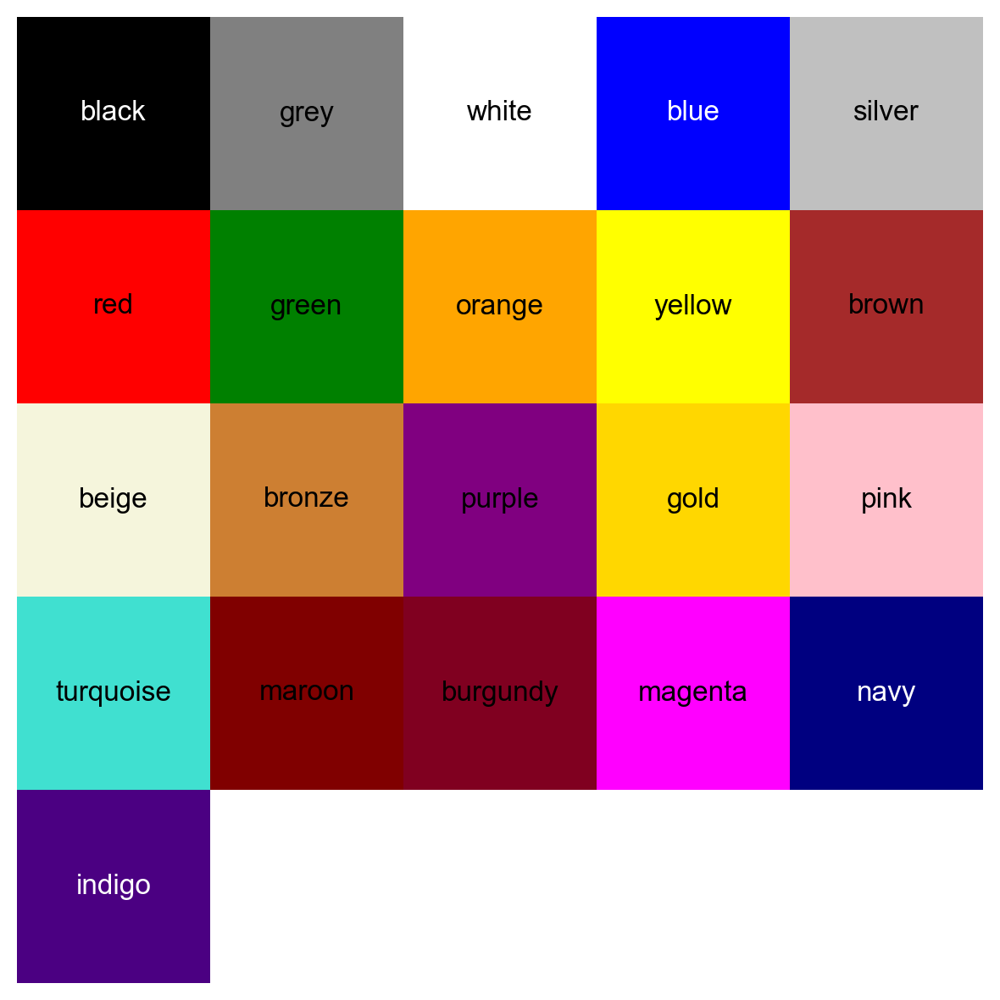

In [44]:
import matplotlib.patches as patches

# Define a 5x5 grid of colors (hex codes or named colors)
colors = [
    ["black", "grey", "white", "blue", "silver"],
    ["red", "green", "orange", "yellow", "brown"],
    ["beige", "#cd7f32", "purple", "gold", "pink"],
    ["turquoise", "maroon", "#800020", "magenta", "navy"],
    ["indigo", "#FFFFFF", "#FFFFFF", "#FFFFFF", "#FFFFFF"],
]

# Create a figure and axes
fig, ax = plt.subplots(figsize=(6, 6))

# Plot the squares
for i, row in enumerate(colors):
    for j, color in enumerate(row):
        rect = patches.Rectangle(
            (j, i), 1, 1, linewidth=0, edgecolor=None, facecolor=color
        )
        ax.add_patch(rect)
        # Add the color name in the center of the square
        if color != "#FFFFFF":
            label = color
            label_map = {"#800020": "burgundy", "#cd7f32": "bronze"}
            if color in label_map.keys():
                label = label_map[color]
            ax.text(
                j + 0.5,       # x-coordinate (center of square)
                i + 0.5,      # y-coordinate (center of square)
                label,         # Text to display
                ha="center",   # Horizontal alignment
                va="center",   # Vertical alignment
                fontsize=12,    # Font size
                color="black" if color not in ["black", "navy", "indigo", "blue"] else "white",  # Text color for contrast
            )

# Set axis limits and turn off axes
ax.set_xlim(0, 5)
ax.set_ylim(5, 0)
ax.axis("off")  # No axis lines or labels

# Show the plot
plt.tight_layout()
plt.show()

All colours are reasonable however, some seem superfluous. For example, the 7 navy cars can be added to blue, burgundy and maroon are basically the same colour, bronze is just shiny brown so they can probably be combined, the 15 magenta ones can be added to pink and the one indigo can be added to purple.

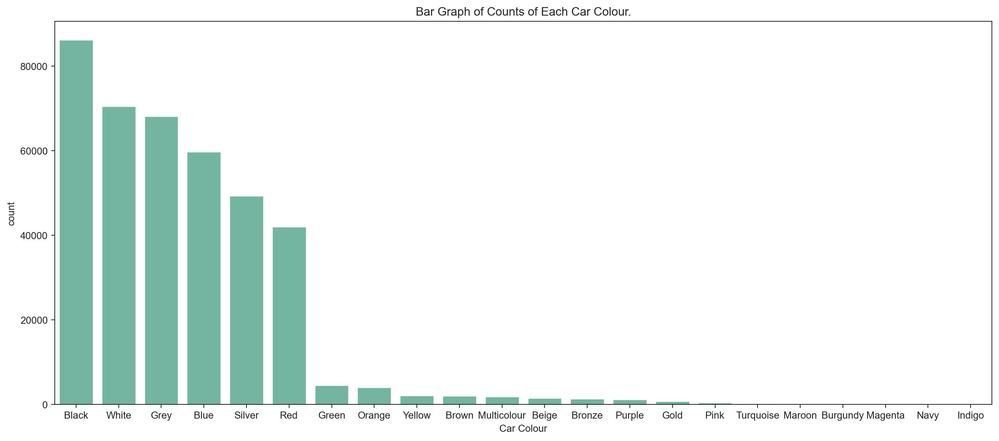

In [45]:
colour_counts = auto['standard_colour'].value_counts(sort=True)
axes = sns.barplot(colour_counts)
axes.set_title("Bar Graph of Counts of Each Car Colour.");
axes.set_xlabel("Car Colour");

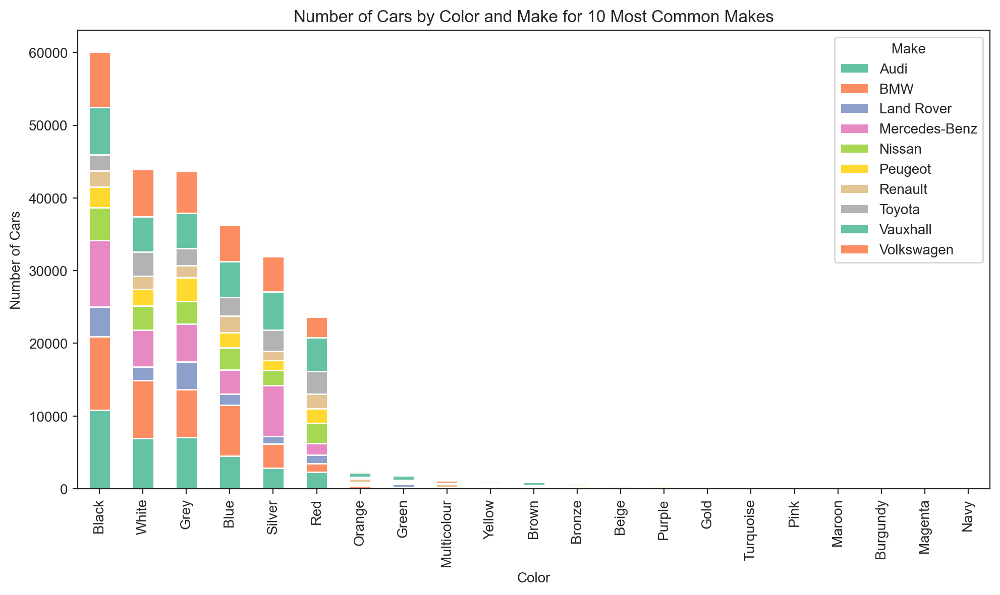

In [46]:
popular_brands = auto['standard_make'].value_counts(sort=True)[:10]

# Create a new column for only the most popular brans
auto['processed_make'] = auto['standard_make'].apply(lambda x: x if x in popular_brands else 'Other')

# Create a new dataframe with the counts of each colour for each make
counts = (
    auto.groupby(['standard_colour', 'processed_make'])
    .size()
    .reset_index(name='count')
)

# Pivot the data to get a table of counts by color and make
pivot_table = counts.pivot_table(index='standard_colour', columns='processed_make', values='count', fill_value=0)

# Calculate the total count for each processed make across all colors
column_totals = pivot_table.sum(axis=0)

# Sort columns by their total count in descending order
sorted_columns = column_totals.sort_values(ascending=False).index
pivot_table = pivot_table[sorted_columns]

# Calculate the total count for each color across all makes
row_totals = pivot_table.sum(axis=1)

# Filter out rows where the processed_make is "Other"
filtered_counts = counts[counts['processed_make'] != 'Other']

# Pivot the data to get a table of counts by color and make
pivot_table = filtered_counts.pivot_table(index='standard_colour', columns='processed_make', values='count', fill_value=0)

# Sort the rows (colors) by their total counts
row_totals = pivot_table.sum(axis=1)
sorted_rows = row_totals.sort_values(ascending=False).index
pivot_table = pivot_table.loc[sorted_rows]

# Plot the stacked bar graph without "Other" brands and sorted colors
pivot_table.plot(kind='bar', stacked=True, figsize=(10, 6))

# Customize the plot
plt.title('Number of Cars by Color and Make for 10 Most Common Makes')
plt.xlabel('Color')
plt.ylabel('Number of Cars')
plt.legend(title='Make')
plt.tight_layout()

# Show the plot
plt.show()

auto.drop(columns="processed_make")

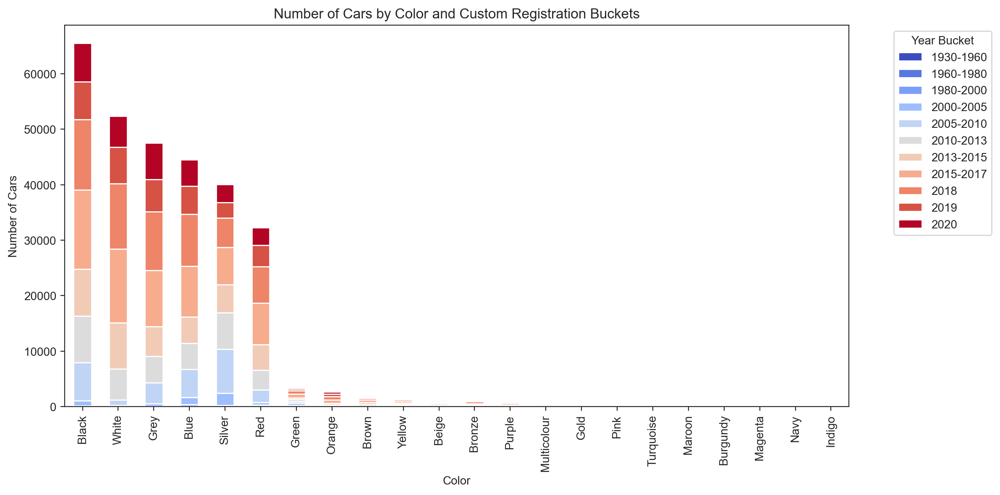

In [47]:
# Step 1: Define custom bins and labels
bins = [1930, 1960, 1980, 2000, 2005, 2010, 2013, 2015, 2017, 2018, 2019, 2020]
labels = [
    "1930-1960", "1960-1980", "1980-2000", "2000-2005", "2005-2010",
    "2010-2013", "2013-2015", "2015-2017", "2018", "2019", "2020"
]

# Assign each year to a bucket
auto['registration_bucket'] = pd.cut(auto['year_of_registration'], bins=bins, labels=labels, right=False)

# Group by color and bucket, then calculate counts
bucket_counts = (
    auto.groupby(['standard_colour', 'registration_bucket'])
    .size()
    .reset_index(name='count')
)

# Pivot the data
pivot_table_buckets = bucket_counts.pivot_table(index='standard_colour', columns='registration_bucket', values='count', fill_value=0)

# Sort rows (colors) by total counts
row_totals_buckets = pivot_table_buckets.sum(axis=1)
sorted_rows_buckets = row_totals_buckets.sort_values(ascending=False).index
pivot_table_buckets = pivot_table_buckets.loc[sorted_rows_buckets]

# Step 2: Map buckets to a red-to-blue colormap
cmap = plt.cm.coolwarm  # Choose a colormap
norm = mcolors.Normalize(vmin=0, vmax=len(labels) - 1)  # Normalize the bucket range

# Create a dictionary mapping each bucket to a color
bucket_colors = {label: cmap(norm(i)) for i, label in enumerate(labels)}

# Step 3: Plot with custom colors
ax = pivot_table_buckets.plot(kind='bar', stacked=True, figsize=(12, 6),
                              color=[bucket_colors[col] for col in pivot_table_buckets.columns])

# Customize the plot
plt.title('Number of Cars by Color and Custom Registration Buckets')
plt.xlabel('Color')
plt.ylabel('Number of Cars')
plt.legend(title='Year Bucket', bbox_to_anchor=(1.05, 1), loc='upper left', labels=labels)
plt.tight_layout()

# Show the plot
plt.show()

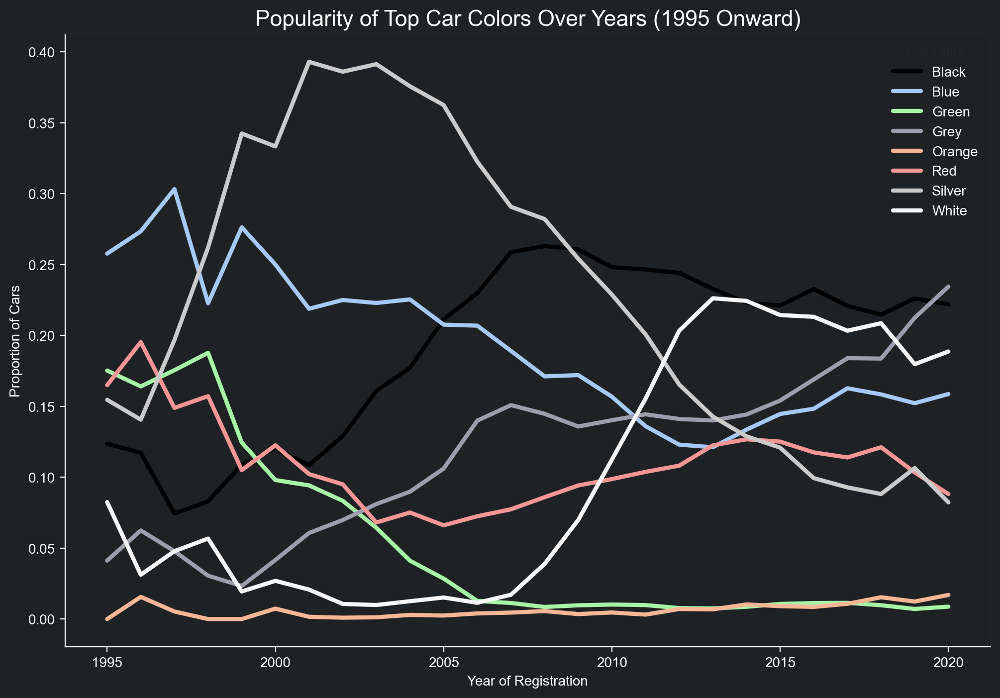

In [48]:
# Filter data for years >= 1980
filtered_auto = auto[auto['year_of_registration'] >= 1995]

# Find the 8 most popular colors 
top_colors = (
    filtered_auto['standard_colour']
    .value_counts()
    .nlargest(8)
    .index
)

# Filter data for only the top colors
filtered_auto = filtered_auto[filtered_auto['standard_colour'].isin(top_colors)]

# Group by year and color, then count
color_year_counts = (
    filtered_auto.groupby(['year_of_registration', 'standard_colour'])
    .size()
    .reset_index(name='count')
)

# Calculate the total number of cars for each year
year_totals = color_year_counts.groupby('year_of_registration')['count'].sum()

# Calculate proportions
color_year_counts['proportion'] = color_year_counts.apply(
    lambda row: row['count'] / year_totals[row['year_of_registration']],
    axis=1
)

# Pivot the data to have colors as columns and years as rows
pivot_table = color_year_counts.pivot_table(
    index='year_of_registration', columns='standard_colour', values='proportion', fill_value=0
)

# Map car colors to line colors
color_mapping = {
    "Red": "#F49696",      # Pastel red
    "Blue": "#A6C8F4",     # Pastel blue
    "Green": "#A6F4A6",    # Pastel green
    "White": "#F7F7F7",    # Light gray (near white)
    "Black": "#000000",    # Light gray for black
    "Silver": "#CACACA",   # Soft silver
    "Grey": "#9D9DAD",     # Pastel gray
    "Orange": "#F7B696",   # Pastel orange
}

# Plot the data with lines colored by car color
fig, ax = plt.subplots(figsize=(12, 8))  # Create figure and axes

# Set the face color of the figure and the axes
ax.set_facecolor("#1F2225")
fig.set_facecolor("#1F2225")

ax.spines['bottom'].set_color('white')
ax.spines['left'].set_color('white')
ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

for color in pivot_table.columns:
    ax.plot(
        pivot_table.index, 
        pivot_table[color], 
        label=color, 
        color=color_mapping.get(color),
        linewidth=3,
    )

# Add titles and labels the plot
ax.set_title('Popularity of Top Car Colors Over Years (1995 Onward)', color="white", fontsize=16)
ax.set_xlabel('Year of Registration')
ax.set_ylabel('Proportion of Cars')
ax.legend(title='Car Color', labelcolor="white", facecolor="#1F2225", edgecolor="#1F2225");

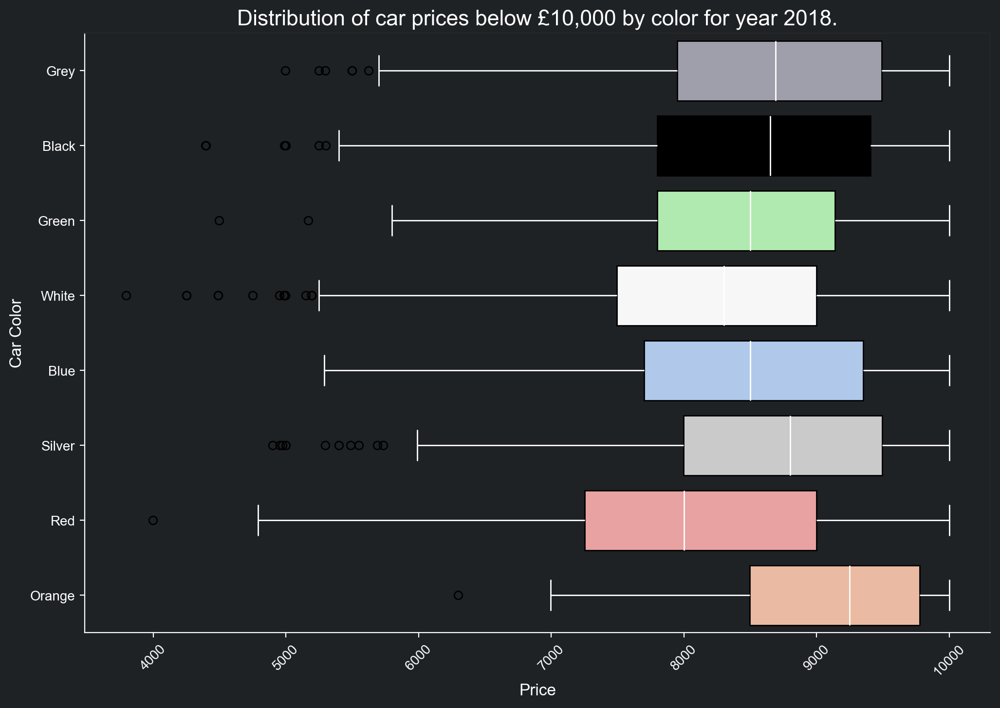

In [49]:
low_price = auto.loc[auto["price"] < 1e4]

low_price = low_price.loc[low_price["year_of_registration"] == 2018]

# Filter data for only the top colors
low_price = low_price[low_price['standard_colour'].isin(top_colors)]

# Update color_mapping for the top colors
box_palette = {color: color_mapping.get(color, "#D3D3D3") for color in top_colors}

# Plot boxplot for car prices by color
fig, ax = plt.subplots(figsize=(12, 8))  # Create figure and axes

# Set the face color of the figure and the axes
ax.set_facecolor("#1F2225")
fig.set_facecolor("#1F2225")
ax.spines['bottom'].set_color('white')
ax.spines['left'].set_color('white')
ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')
ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')


sns.boxplot(data=low_price, y='standard_colour', x='price', palette=box_palette, orient="h")

# Customize whiskers
for line in ax.lines:  # Lines include whiskers, medians, caps, and fliers
    line.set_color('white')  # Set whisker and cap color to white
    
plt.title('Distribution of car prices below £10,000 by color for year 2018.', fontsize=16, color="white")
plt.xlabel('Price', fontsize=12)
plt.ylabel('Car Color', fontsize=12)
plt.xticks(rotation=45)
plt.show()

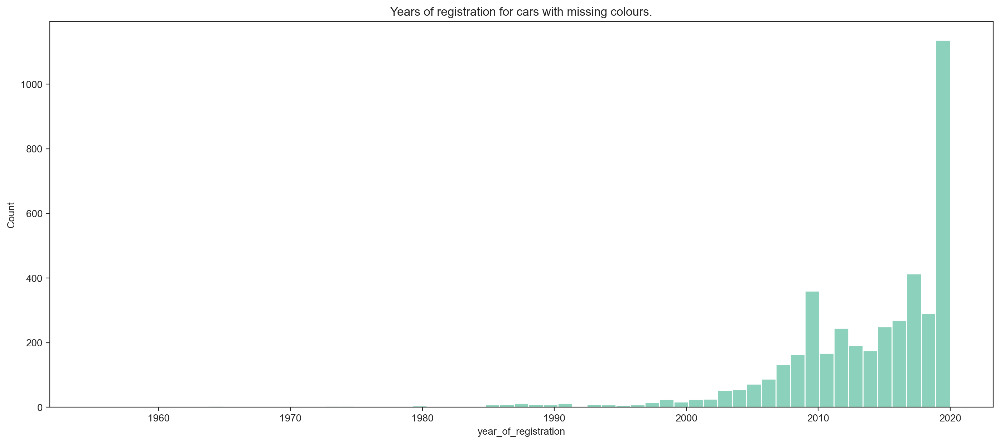

In [50]:
missing_colours = auto.loc[auto["standard_colour"].isnull()]
sns.histplot(missing_colours, x="year_of_registration");
plt.title("Years of registration for cars with missing colours.");

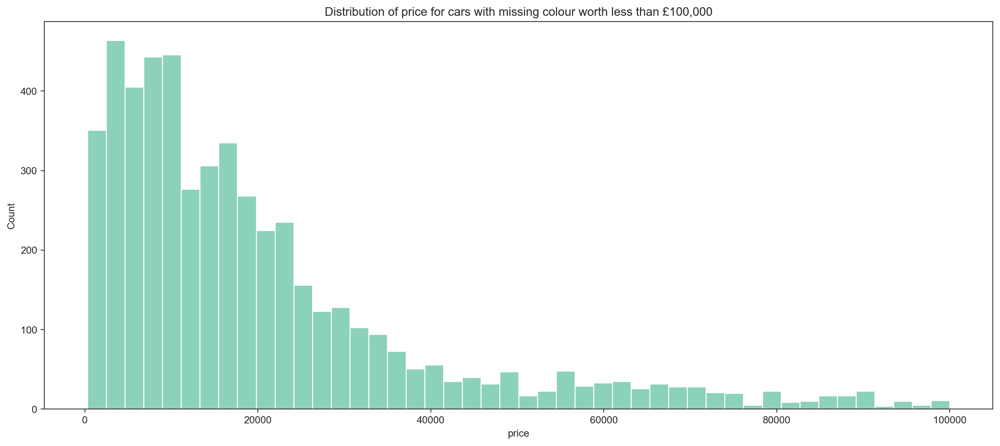

In [51]:
sns.histplot(missing_colours.loc[missing_colours["price"] < 1e5], x="price");
plt.title("Distribution of price for cars with missing colour worth less than £100,000");

## Colour Summary

All colours are reasonable however, some seem superfluous. For example, the 7 navy cars can be added to blue, burgundy and maroon are basically the same colour, bronze is just shiny brown so they can probably be combined, the 15 magenta ones can be added to pink and the one indigo can be added to purple.

The 5378 null colours need to be imputed.

---
&nbsp;

&nbsp;

# ==== Make and Model ====

In [43]:
len(auto['standard_model'].unique())

1168

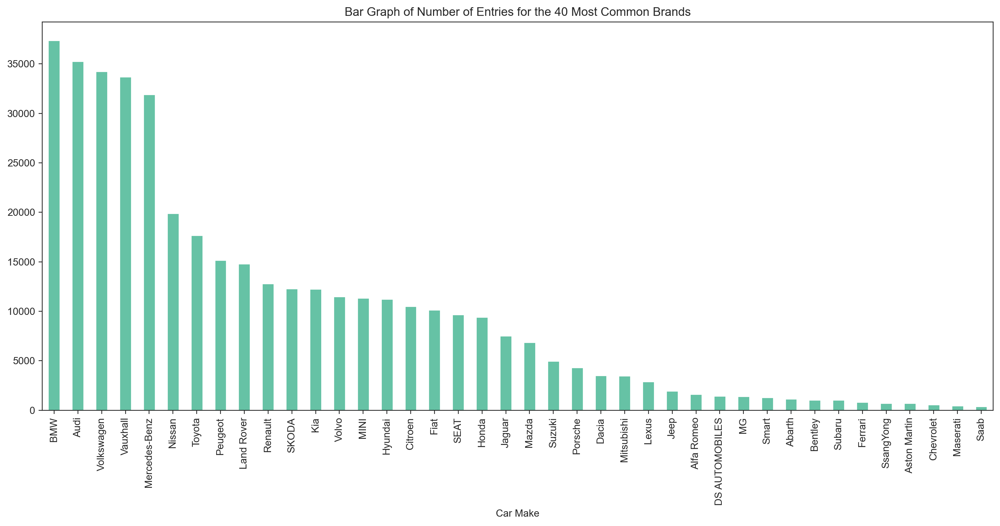

In [52]:
axes = auto['standard_make'].value_counts(sort=True)[:40].plot.bar()
axes.set_title("Bar Graph of Number of Entries for the 40 Most Common Brands");
axes.set_xlabel("Car Make");

In [ ]:
# Combine make and model into one column
auto['make_model'] = auto['standard_make'] + ' ' + auto['standard_model']
auto.drop(columns=["standard_make", "standard_model"], inplace=True)

In [58]:
auto

,public_reference,mileage,reg_code,standard_colour,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,reg_code_year,processed_make,registration_bucket,make_model
0,202006039777689,0.0,NaN,Grey,NEW,NaN,73970.0,SUV,False,Petrol Plug-in Hybrid,NaN,Other,NaN,Volvo XC90
1,202007020778260,108230.0,61,Blue,USED,2011.0,7000.0,Saloon,False,Diesel,2011.0,Other,NaN,Jaguar XF
2,202007020778474,7800.0,17,Grey,USED,2017.0,14000.0,SUV,False,Petrol,2017.0,Other,NaN,SKODA Yeti
3,202007080986776,45000.0,16,Brown,USED,2016.0,7995.0,Hatchback,False,Diesel,2016.0,Vauxhall,2015-2017,Vauxhall Mokka
4,202007161321269,64000.0,64,Grey,USED,2015.0,26995.0,SUV,False,Diesel,2015.0,Land Rover,2015-2017,Land Rover Range Rover Sport
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
402000,202010315652942,5179.0,69,Grey,USED,2019.0,10595.0,Hatchback,False,Petrol,2019.0,Peugeot,2020,Peugeot 208
402001,202010315657341,110000.0,59,Red,USED,2009.0,2000.0,Hatchback,False,Petrol,2009.0,Peugeot,2005-2010,Peugeot 107
402002,202010315659271,52760.0,62,White,USED,2012.0,7250.0,SUV,False,Petrol,2012.0,Nissan,2010-2013,Nissan Qashqai
402003,202011015662436,10250.0,65,Red,USED,2015.0,11490.0,Hatchback,False,Petrol,2015.0,Other,2015-2017,Abarth 595


# Fuel Type

In [61]:
auto.loc[(auto["fuel_type"]=="Electric") & (auto["crossover_car_and_van"]==1)]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
15393,201910163376428,12.0,NaN,Black,Nissan,e-NV200,NEW,NaN,32990.0,Combi Van,True,Electric
37100,202010064647201,39500.0,18,Black,LEVC,TX,USED,2018.0,38000.0,MPV,True,Electric
44587,201909262647527,12.0,NaN,White,Nissan,e-NV200,NEW,NaN,31490.0,Combi Van,True,Electric
55410,202007030828603,750.0,15,Black,Renault,Twizy,USED,2015.0,8911.0,Coupe,True,Electric
62085,202009153766168,14800.0,15,White,Renault,Twizy,USED,2015.0,5994.0,Coupe,True,Electric
89871,202008262948789,50.0,NaN,Red,Nissan,e-NV200,NEW,NaN,24499.0,Combi Van,True,Electric
103757,202001306771208,10.0,NaN,White,Nissan,eNV200 Evalia,NEW,NaN,32599.0,MPV,True,Electric
106497,202002207529293,28.0,69,White,LEVC,TX,USED,2019.0,45000.0,MPV,True,Electric
146476,202007111113481,3026.0,20,Black,Nissan,eNV200 Evalia,USED,2020.0,30995.0,MPV,True,Electric
159330,202001306771219,10.0,NaN,White,Nissan,e-NV200,NEW,NaN,30899.0,Combi Van,True,Electric


<Axes: xlabel='fuel_type', ylabel='count'>

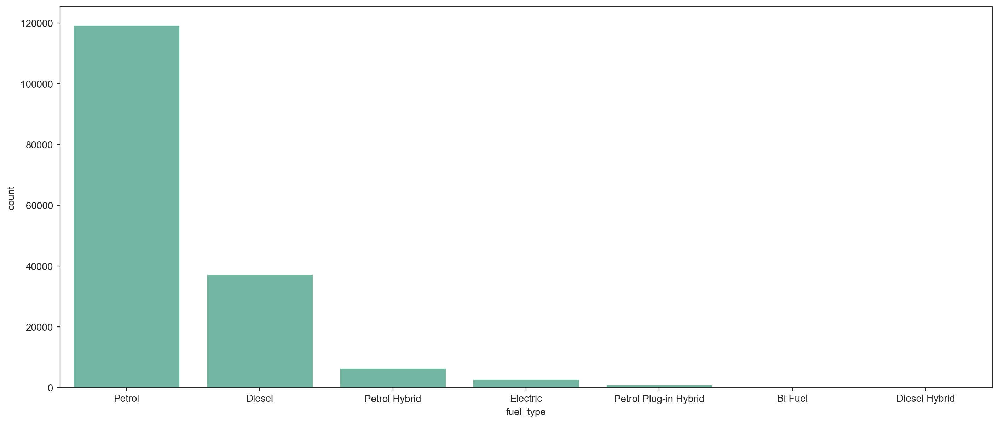

In [56]:
sns.barplot(auto.loc[auto["body_type"]=="Hatchback","fuel_type"].value_counts())

In [63]:
auto["fuel_type"].unique()

array(['Petrol Plug-in Hybrid', 'Diesel', 'Petrol', 'Diesel Hybrid',
       'Petrol Hybrid', 'Electric', 'Diesel Plug-in Hybrid', nan,
       'Bi Fuel', 'Natural Gas'], dtype=object)